In [ ]:
import warnings
warnings.filterwarnings('ignore')

# Librerias a instalar

In [ ]:
!pip install statsmodels==0.12.2
!pip install skforecast
!pip install tslearn

In [ ]:
!pip install minisom


##Introducción
La estimación correcta de la demanda de agua potable representa una condición indispensable para la planificación, diseño y operación eficiente y sostenible de todos los elementos que conforman los sistemas de captación, transporte y suministro de agua potable. Esta demanda está sujeta a variaciones interanuales, estacionales, semanales, diarias e incluso horarias, muy significativas y que dependen de múltiples factores como son los ciclos de actividad económica, la meteorología, las situaciones de crisis sanitaria, los cambios en los bloques tarifarios, etc. Dado lo anterior y partiendo de un amplio dataset con un histórico de consumos y utilizando otras bases de datos abiertos, te retamos a crear el mejor modelo de predicción de consumos en base al cual podamos realizar estimaciones a futuro en cualquiera de los municipios que gestionamos en España.

**Variables**
 

*   ID: Identificador del Contador que registra la medida de lectura.
*   SAMPLETIME: Fecha y hora del consumo en formato UTC. Momento en el que se
produce el mensaje o el contador ha emitido el registro.
*   READINGINTEGER: Medida registrada por el contador en litros. Parte entera.
*   READINGTHOUSANDTH: Medida registrada por el contador en litros. Parte decimal.
*   DELTAINTEGER: Consumo calculado en litros a partir de la medida registrada por el contador. Parte entera.
*   DELTATHOUSANDTH: Consumo calculado en litros a partir de la medida registrada por el contador. Parte decimal.


Los ID están ordenados de forma ascendente pero no son correlativos

**Formato y estructura**
Este dataset tiene extensión txt con la siguiente estructura y formato:
• Nombres de variables: incluidos en la cabecera
• Separador: "|"
• Codificación: UTF-8
Sin nombre de fila.

# Exploración inicial de datos

Vamos a ver los aspectos generales de la serie de datos, para ello, primero vemos como se distribuyen los datos en general, y vemos si podemos trabajar la tabla para manejar los datos más fácilmente

In [ ]:
import pandas as pd
import numpy as np
import copy

In [44]:
water_consumptions = pd.read_csv('~/Modelar_UH2022.txt', sep="|")
water_consumptions.head(15)

,ID,SAMPLETIME,READINGINTEGER,READINGTHOUSANDTH,DELTAINTEGER,DELTATHOUSANDTH
0,0,2019-06-13 08:34:09,369320,0.0,17,0.0
1,0,2019-06-13 17:34:10,369403,0.0,2,0.0
2,0,2019-06-13 18:34:10,369403,0.0,0,0.0
3,0,2019-06-13 04:34:10,369284,0.0,1,0.0
4,0,2019-06-13 14:34:10,369356,0.0,28,0.0
5,0,2019-06-13 01:34:09,369283,0.0,0,0.0
6,0,2019-06-13 16:34:10,369401,0.0,42,0.0
7,0,2019-06-13 10:34:09,369323,0.0,0,0.0
8,0,2019-06-13 22:34:08,369511,0.0,15,0.0
9,0,2019-06-13 23:34:08,369552,0.0,41,0.0


In [45]:
water_consumptions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21404828 entries, 0 to 21404827
Data columns (total 6 columns):
 #   Column             Dtype  
---  ------             -----  
 0   ID                 int64  
 1   SAMPLETIME         object 
 2   READINGINTEGER     int64  
 3   READINGTHOUSANDTH  float64
 4   DELTAINTEGER       int64  
 5   DELTATHOUSANDTH    float64
dtypes: float64(2), int64(3), object(1)
memory usage: 979.8+ MB


Sampletime es en realidad un timestamp, así que lo convertimos.
La medida que realmente nos aporta valor es DELTAINTEGER que es el valor que en cada medida suma el contador de agua respecto al valor anterior

In [46]:
water_consumptions['SAMPLETIME'] = water_consumptions['SAMPLETIME'].astype('datetime64[ns]')
select_columns = ['ID', 'SAMPLETIME', 'DELTAINTEGER']
water_consumptions = water_consumptions[select_columns]

In [47]:
water_consumptions.describe()

,ID,DELTAINTEGER
count,2.140483e+07,2.140483e+07
mean,1.259029e+03,2.277017e+01
std,7.334956e+02,1.516794e+03
min,0.000000e+00,-5.307340e+05
25%,6.230000e+02,0.000000e+00
50%,1.255000e+03,0.000000e+00
75%,1.887000e+03,9.000000e+00
max,2.756000e+03,9.499810e+05


Mejoramos los nombres de las variables y ordenamos por id y fecha

In [48]:
water_consumptions.set_axis(['id', 'datetime', 'consumption'], axis=1, inplace=True)
water_consumptions.sort_values(by=['id', 'datetime'])

,id,datetime,consumption
160,0,2019-02-01 00:39:36,0
152,0,2019-02-01 01:39:36,0
150,0,2019-02-01 02:39:35,0
156,0,2019-02-01 03:39:35,0
161,0,2019-02-01 04:39:35,0
...,...,...,...
21404822,2749,2019-10-11 07:27:14,2
21404826,2756,2019-04-06 04:50:17,0
21404824,2756,2019-04-06 05:50:17,0
21404827,2756,2019-04-06 06:50:17,0


Como el objetivo del trabajo es predecir el consumo diario de los contadores, será mejor que simplifiquemos y trabajemos por los valores diarios

In [ ]:
water_consumptions['datetime'] = water_consumptions.apply (lambda row: row.datetime.date(), axis=1)

In [ ]:

water_consumptions = water_consumptions.groupby(['id','datetime'])['consumption'].sum()
water_consumptions.head(10)


In [ ]:
water_consumptions = water_consumptions.to_frame().reset_index()
water_consumptions.head()

In [ ]:
path = '~/water_consumptions_day.txt'

with open(path, 'w',encoding = 'utf-8-sig') as f:
  water_consumptions.to_csv(f)

In [53]:
select = ['id','datetime','consumption']
df_daily_consumptions = pd.read_csv(path,usecols=select, sep=",")
df_daily_consumptions.head(10)

,id,datetime,consumption
0,0,2019-02-01,243
1,0,2019-02-02,236
2,0,2019-02-03,335
3,0,2019-02-04,252
4,0,2019-02-05,220
5,0,2019-02-06,276
6,0,2019-02-07,277
7,0,2019-02-08,193
8,0,2019-02-09,262
9,0,2019-02-10,315


Miramos cuantos IDs tenemos en esta parte de los datos

In [54]:
df_daily_consumptions['datetime'] = df_daily_consumptions['datetime'].astype('datetime64[ns]')
a = df_daily_consumptions['datetime'].max()
b = df_daily_consumptions['datetime'].min()
c = a-b

print(" Max date is:  ",a, "  Min date is:  ",b, "number of days is:  ", c)

 Max date is:   2020-01-31 00:00:00   Min date is:   2019-02-01 00:00:00 number of days is:   364 days 00:00:00


(array([83789., 82764., 86937., 86341., 87024., 90984., 88326., 94441.,
        93381., 96850.]),
 array([737091. , 737127.4, 737163.8, 737200.2, 737236.6, 737273. ,
        737309.4, 737345.8, 737382.2, 737418.6, 737455. ]),
 <a list of 10 Patch objects>)

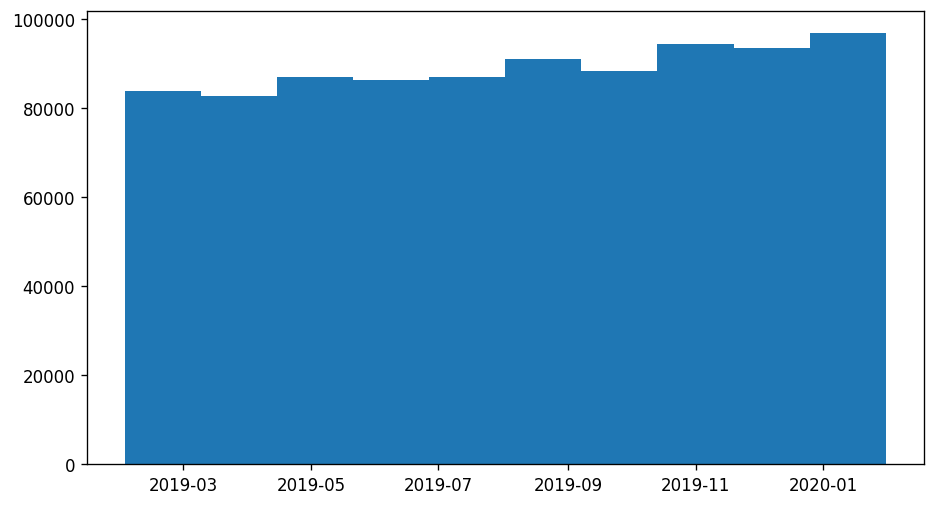

In [55]:
import matplotlib.pyplot as plt

plt.hist(df_daily_consumptions['datetime'])

Las fechas se distribuyen de manera bastante uniforme, ligeramente creciente, entiendo que a lo largo de la serie se van incorporando nuevos ids

¿Cuántos ids tenemos en total?

In [56]:
len(set(df_daily_consumptions['id']))

2747

Podemos mirar cuantos días tienen cada uno de los ids

In [57]:
(df_daily_consumptions['id'].value_counts() < 365).value_counts()

False    1975
True      772
Name: id, dtype: int64

(array([  66.,   53.,   54.,   37.,   43.,   75.,   43.,  180.,   75.,
        2121.]),
 array([  1. ,  37.4,  73.8, 110.2, 146.6, 183. , 219.4, 255.8, 292.2,
        328.6, 365. ]),
 <a list of 10 Patch objects>)

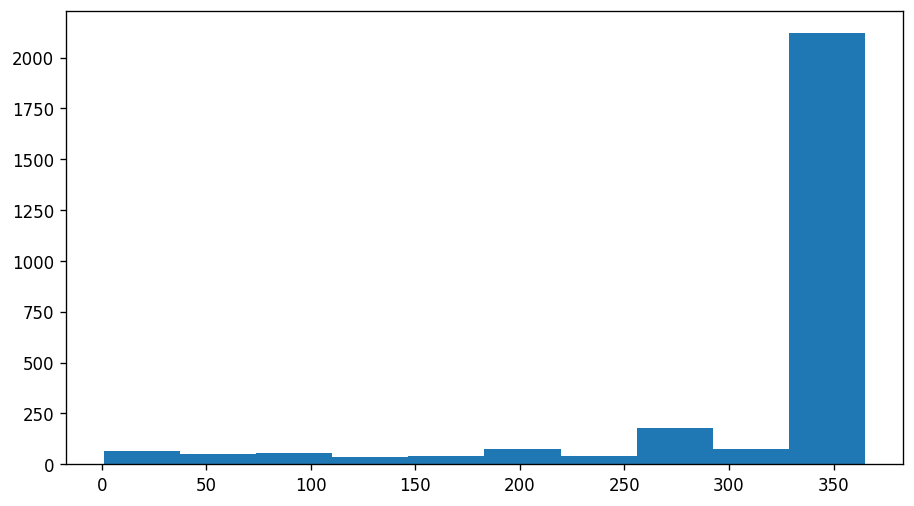

In [58]:
plt.hist(df_daily_consumptions['id'].value_counts())

Vemos que claramente una amplia mayoría de los ids tiene toda la serie completa, a destacar un grupo de unos 200 que tiene entre 250 y 300 días.
Esta desigualdad puede afectar a la serie general de utilizarlos todos juntos.

# Prueba con 100 IDs

Empezamos desde aquí las siguientes veces

Una vez tenemos un subset del dataset con el consumo diario por id. Vamos a estudiar las caracterísitcas del subset

In [59]:
water_consumptions = pd.read_csv('~/Modelar_UH2022.txt', sep="|")
water_consumptions['SAMPLETIME'] = water_consumptions['SAMPLETIME'].astype('datetime64[ns]')
selected_columns = ['ID', 'SAMPLETIME', 'DELTAINTEGER']
water_consumptions = water_consumptions[selected_columns]
water_consumptions.set_axis(['id', 'datetime', 'consumption'], axis=1, inplace=True)
water_consumptions = water_consumptions.sort_values(by=['id', 'datetime'])

In [60]:
use_reduced = True
create_reduced = True
create_complete = True
if create_reduced:
  water_consumptions_reduced = water_consumptions[water_consumptions['id'] < 100]
  len(water_consumptions)
  water_consumptions_reduced.to_csv('WaterConsumptions100.csv')
  if use_reduced:
    water_consumptions = water_consumptions_reduced
if create_complete:
  water_consumptions.to_csv('WaterConsumptionsComplete.csv')

In [61]:
water_consumptions['datetime'] = water_consumptions.apply (lambda row: row.datetime.date(), axis=1)
water_consumptions.head(25)

,id,datetime,consumption
160,0,2019-02-01,0
152,0,2019-02-01,0
150,0,2019-02-01,0
156,0,2019-02-01,0
161,0,2019-02-01,0
153,0,2019-02-01,0
158,0,2019-02-01,0
159,0,2019-02-01,19
5422,0,2019-02-01,36
157,0,2019-02-01,0


In [62]:
water_consumptions.set_axis(['id', 'date', 'consumption'], axis=1, inplace=True)

water_consumptions = water_consumptions.groupby(['id','date'])['consumption'].sum()
water_consumptions.head()

id  date      
0   2019-02-01    243
    2019-02-02    236
    2019-02-03    335
    2019-02-04    252
    2019-02-05    220
Name: consumption, dtype: int64

In [63]:
water_consumption_per_id_day_df = water_consumptions.to_frame().reset_index()
water_consumption_per_id_day_df.head()

,id,date,consumption
0,0,2019-02-01,243
1,0,2019-02-02,236
2,0,2019-02-03,335
3,0,2019-02-04,252
4,0,2019-02-05,220


In [64]:
len(set(water_consumption_per_id_day_df['id']))

100

In [65]:
water_consumption_per_day = water_consumption_per_id_day_df.drop('id', axis=1).groupby('date').sum()
water_consumption_per_day.head()

,consumption
date,
2019-02-01,41711
2019-02-02,27709
2019-02-03,28063
2019-02-04,47003
2019-02-05,41736


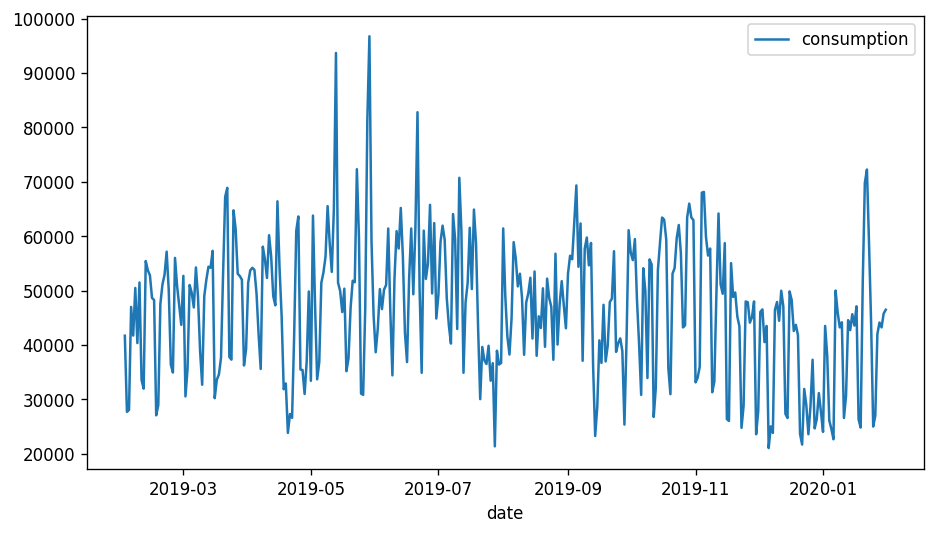

In [66]:
water_consumption_per_day.plot()

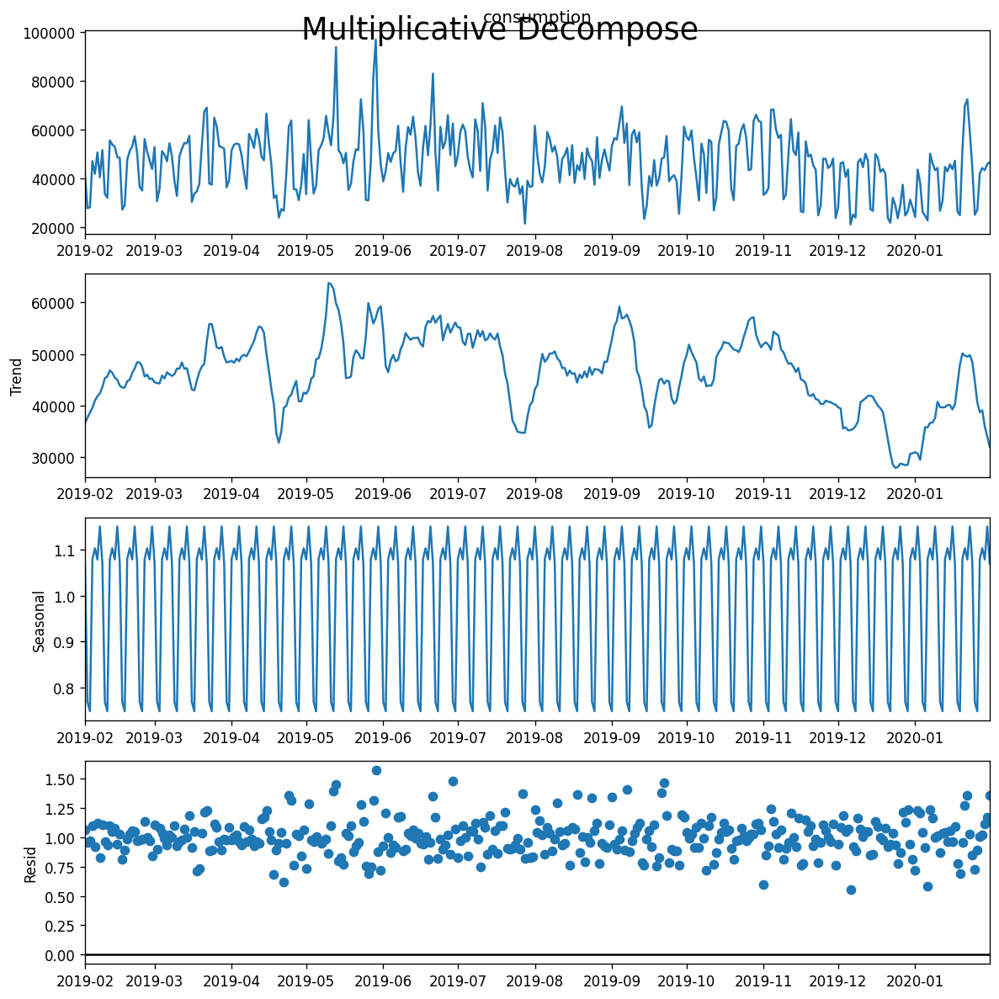

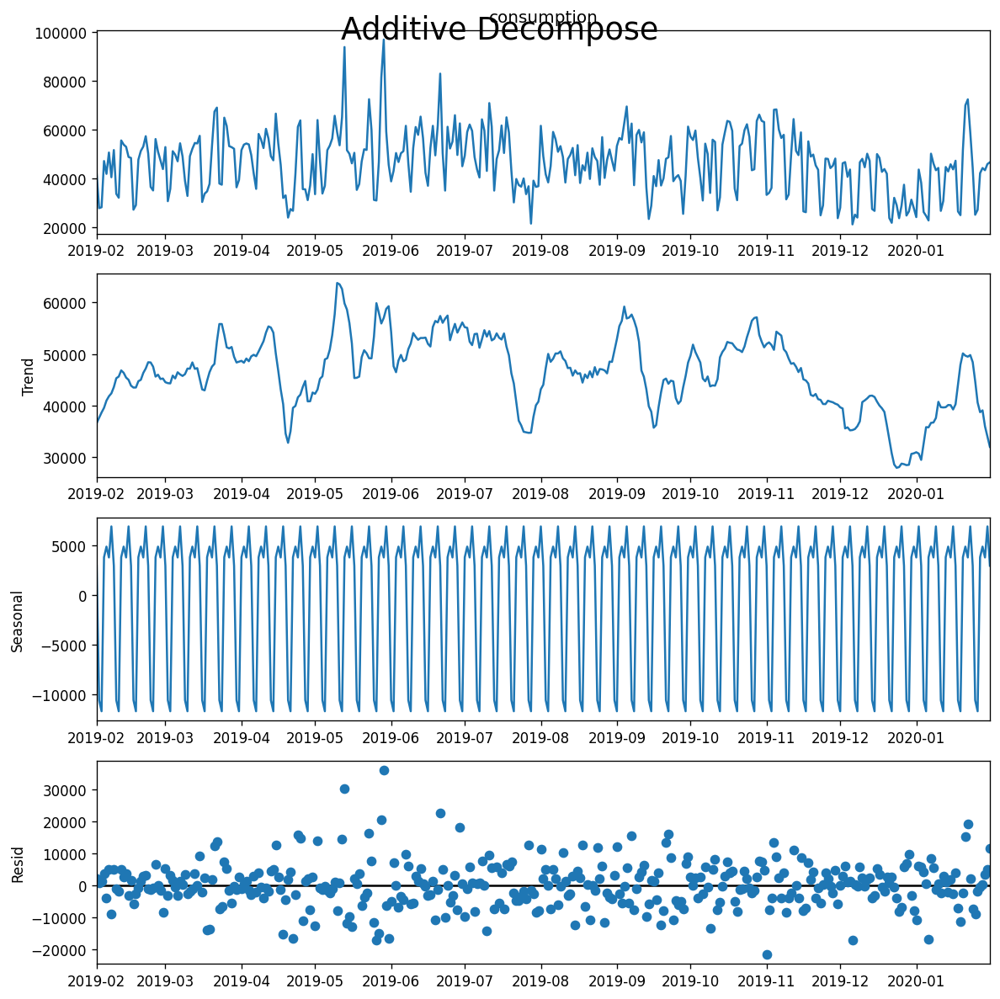

In [67]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

water_consumption_per_day.index = pd.to_datetime(water_consumption_per_day.index)

result_mul = seasonal_decompose(water_consumption_per_day['consumption'], model='multiplicative', extrapolate_trend='freq')
result_add = seasonal_decompose(water_consumption_per_day['consumption'], model='additive', extrapolate_trend='freq')


# Plot
plt.rcParams.update({'figure.figsize': (10,10)})
result_mul.plot().suptitle('Multiplicative Decompose', fontsize=22)
result_add.plot().suptitle('Additive Decompose', fontsize=22)
plt.show()

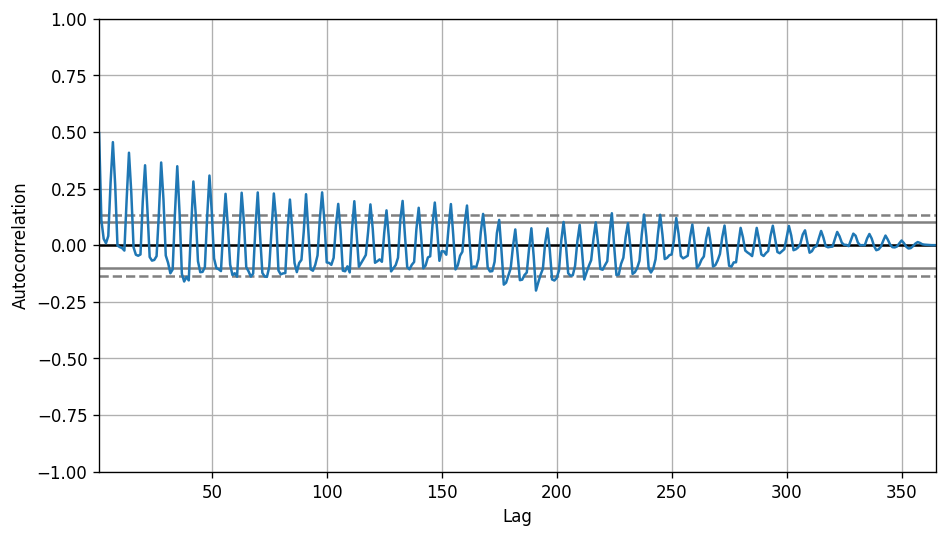

In [68]:
from pandas.plotting import autocorrelation_plot

# Draw Plot
plt.rcParams.update({'figure.figsize':(9,5), 'figure.dpi':120})
autocorrelation_plot(water_consumption_per_day.consumption.tolist())

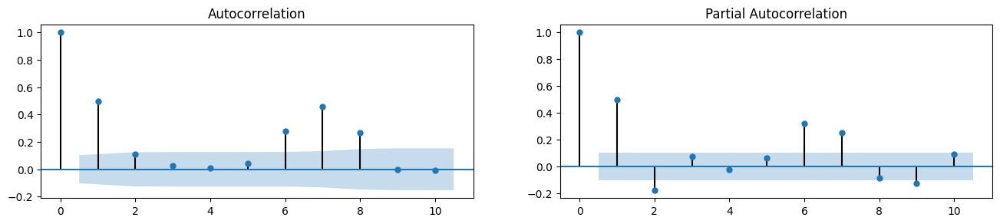

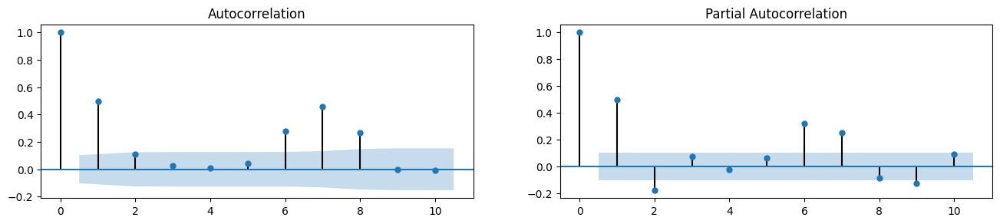

In [69]:
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

fig, axes = plt.subplots(1,2,figsize=(16,3), dpi= 100)
plot_acf(water_consumption_per_day.consumption.tolist(), lags=10, ax=axes[0])
plot_pacf(water_consumption_per_day.consumption.tolist(), lags=10, ax=axes[1])

## Análisis por semanas

In [70]:
water_consumption_per_id_day_df['week'] = water_consumption_per_id_day_df.apply(lambda row: row.date.strftime("%V"), axis=1)
water_consumption_per_id_day_df['year'] = water_consumption_per_id_day_df.apply(lambda row: row.date.year, axis= 1)
water_consumption_per_id_day_df.drop(['date'], axis=1, inplace=True)
daily_week_consumptions = water_consumption_per_id_day_df.groupby(['id', 'year', 'week']).agg(list)
daily_week_consumptions

consumption
id year week                                     
0  2019 01                             [338, 327]
        05                        [243, 236, 335]
        06    [252, 220, 276, 277, 193, 262, 315]
        07    [224, 337, 219, 264, 384, 279, 343]
        08    [320, 410, 259, 313, 381, 222, 355]
...                                           ...
99 2020 01                [42, 123, 212, 78, 196]
        02       [83, 182, 175, 91, 212, 163, 75]
        03     [135, 102, 159, 147, 254, 149, 83]
        04      [87, 118, 103, 257, 118, 150, 58]
        05              [102, 105, 188, 161, 297]

[5251 rows x 1 columns]

## Filtering uncomplete weeks

In [71]:
daily_week_consumptions_filtered = daily_week_consumptions[daily_week_consumptions['consumption'].map(len) == 7]
daily_week_consumptions_filtered = daily_week_consumptions_filtered[daily_week_consumptions_filtered['consumption'].map(sum) != 0]
daily_week_consumptions_filtered

consumption
id year week                                     
0  2019 06    [252, 220, 276, 277, 193, 262, 315]
        07    [224, 337, 219, 264, 384, 279, 343]
        08    [320, 410, 259, 313, 381, 222, 355]
        09    [383, 248, 314, 180, 208, 230, 354]
        10    [321, 319, 303, 243, 135, 266, 423]
...                                           ...
99 2019 51    [122, 174, 108, 119, 137, 142, 136]
        52     [557, 237, 46, 109, 239, 234, 119]
   2020 02       [83, 182, 175, 91, 212, 163, 75]
        03     [135, 102, 159, 147, 254, 149, 83]
        04      [87, 118, 103, 257, 118, 150, 58]

[4404 rows x 1 columns]

In [72]:
weekly_consumptions = daily_week_consumptions_filtered['consumption']
weekly_consumptions

id  year  week
0   2019  06      [252, 220, 276, 277, 193, 262, 315]
          07      [224, 337, 219, 264, 384, 279, 343]
          08      [320, 410, 259, 313, 381, 222, 355]
          09      [383, 248, 314, 180, 208, 230, 354]
          10      [321, 319, 303, 243, 135, 266, 423]
                                 ...                 
99  2019  51      [122, 174, 108, 119, 137, 142, 136]
          52       [557, 237, 46, 109, 239, 234, 119]
    2020  02         [83, 182, 175, 91, 212, 163, 75]
          03       [135, 102, 159, 147, 254, 149, 83]
          04        [87, 118, 103, 257, 118, 150, 58]
Name: consumption, Length: 4404, dtype: object

## Normalización semanas

In [73]:
weekly_consumptions_df = weekly_consumptions.reset_index()
weekly_consumptions_df['sum_row'] = weekly_consumptions_df.apply(lambda row: sum(row.consumption), axis=1)
weekly_consumptions_df['normalized_consumptions'] = weekly_consumptions_df.apply(lambda row: [x / row.sum_row for x in row.consumption], axis=1)
normalized_weekly_consumptions = weekly_consumptions_df['normalized_consumptions'].to_numpy()
normalized_weekly_consumptions

array([list([0.1403899721448468, 0.12256267409470752, 0.15376044568245126, 0.1543175487465181, 0.1075208913649025, 0.14596100278551533, 0.17548746518105848]),
       list([0.10926829268292683, 0.16439024390243903, 0.10682926829268292, 0.12878048780487805, 0.1873170731707317, 0.13609756097560977, 0.16731707317073172]),
       list([0.1415929203539823, 0.18141592920353983, 0.11460176991150442, 0.13849557522123893, 0.16858407079646018, 0.09823008849557523, 0.1570796460176991]),
       ...,
       list([0.08460754332313965, 0.18552497451580022, 0.1783893985728848, 0.09276248725790011, 0.2161060142711519, 0.16615698267074414, 0.0764525993883792]),
       list([0.13119533527696792, 0.09912536443148688, 0.15451895043731778, 0.14285714285714285, 0.2468415937803693, 0.14480077745383868, 0.08066083576287658]),
       list([0.09764309764309764, 0.1324354657687991, 0.11560044893378227, 0.2884399551066218, 0.1324354657687991, 0.16835016835016836, 0.06509539842873176])],
      dtype=object)

In [74]:
array_normalized_weekly = [np.asarray(x) for x in normalized_weekly_consumptions]

## Clusterización semanas
### K-Means
#### Método del codo

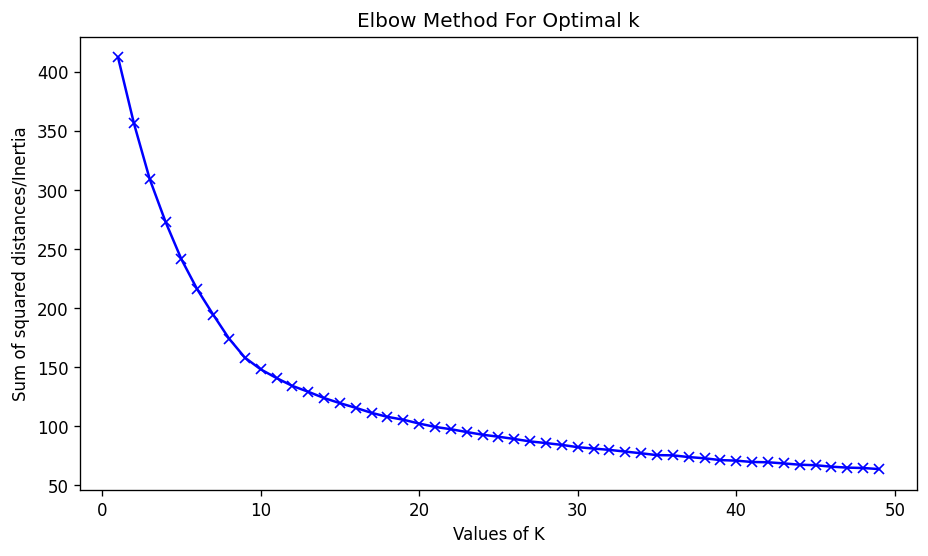

In [75]:
import sklearn
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

Sum_of_squared_distances = []
K = range(1,50)
for num_clusters in K :
 kmeans = KMeans(n_clusters=num_clusters)
 kmeans.fit(array_normalized_weekly)
 Sum_of_squared_distances.append(kmeans.inertia_)
plt.plot(K,Sum_of_squared_distances,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Sum of squared distances/Inertia') 
plt.title('Elbow Method For Optimal k')
plt.show()

#### Silhouette

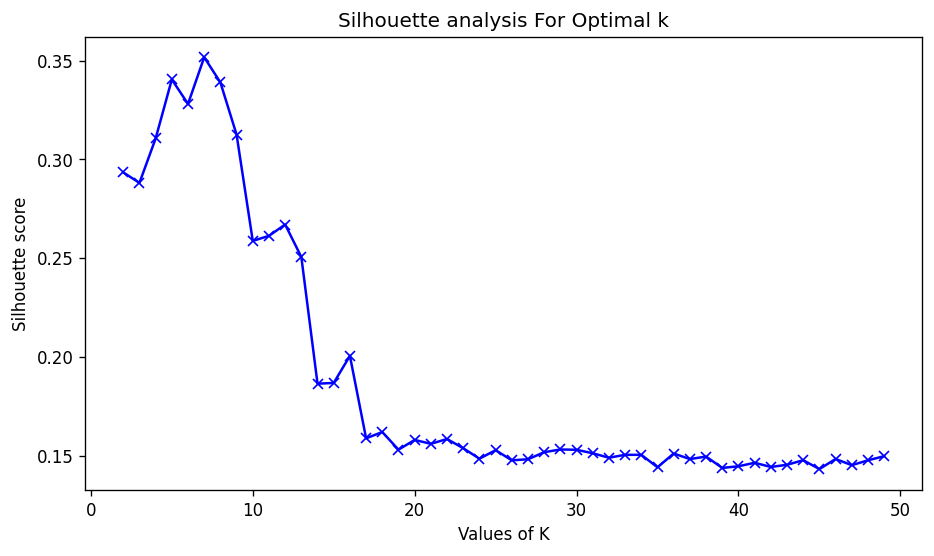

In [76]:
range_n_clusters = range(2,50)
silhouette_avg = []
iter_per_n_clusters = 5
for num_clusters in range_n_clusters:
  total = 0
  for i in range(0, iter_per_n_clusters): 
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(array_normalized_weekly)
    cluster_labels = kmeans.labels_
    total = total + silhouette_score(array_normalized_weekly, cluster_labels)
  # silhouette score
  silhouette_avg.append(total / iter_per_n_clusters)
plt.plot(range_n_clusters,silhouette_avg,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Silhouette score') 
plt.title('Silhouette analysis For Optimal k')
plt.show()

[ 7  7 12 ...  7 12  0]


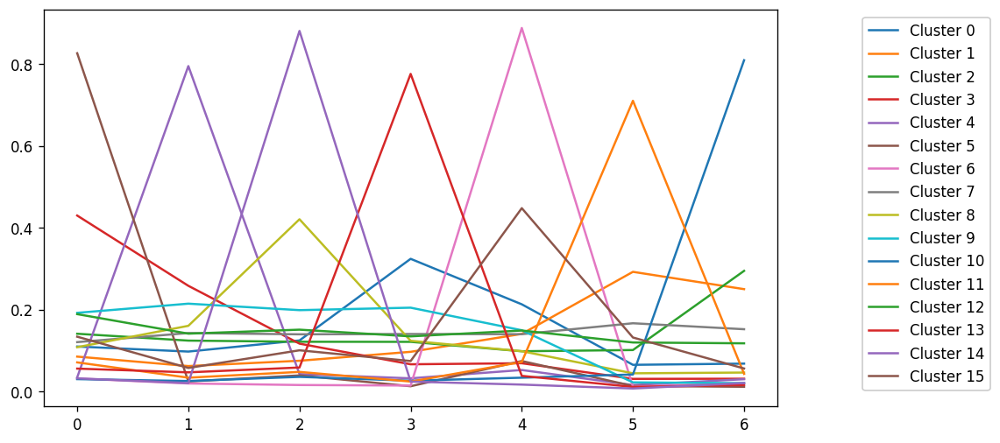

In [77]:
optimal_number_clusters = 16
kmeans = KMeans(n_clusters=optimal_number_clusters)
kmeans.fit(array_normalized_weekly)
cluster_labels = kmeans.labels_
print(cluster_labels)
centers = kmeans.cluster_centers_

for i in range(len(centers)):
  plt.plot(centers[i], label='Cluster {}'.format(i));
plt.legend(bbox_to_anchor=(1.3,1), framealpha=1, frameon=True);

### DBScan

In [78]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=0.1)
dbscan.fit(array_normalized_weekly)
cluster_labels = dbscan.labels_

silhouette_score(array_normalized_weekly, cluster_labels)

0.11166013684887635

(array([4124.,   74.,   31.,   48.,   17.,   31.,   18.,   15.,   33.,
          13.]),
 array([-1. ,  1.6,  4.2,  6.8,  9.4, 12. , 14.6, 17.2, 19.8, 22.4, 25. ]),
 <a list of 10 Patch objects>)

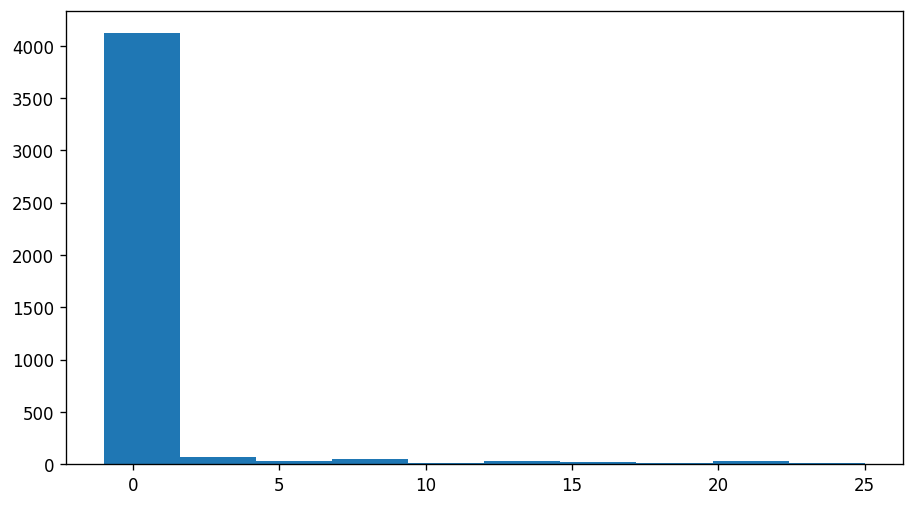

In [79]:
plt.hist(cluster_labels)

# Serie temporal completa
Podemos el consumo diario de toda esa serie, y probar una pequeña predicción sobre un conjunto de train y test

In [80]:
water_consumption_per_day

,consumption
date,
2019-02-01,41711
2019-02-02,27709
2019-02-03,28063
2019-02-04,47003
2019-02-05,41736
...,...
2020-01-27,42021
2020-01-28,44136
2020-01-29,43246


In [81]:
from datetime import datetime

first_test_date = datetime(2020, 1, 1)
train_general = water_consumption_per_day[water_consumption_per_day.index < first_test_date]
test_general = water_consumption_per_day[water_consumption_per_day.index >= first_test_date]
print(len(train_general))
print(len(test_general))

334
31


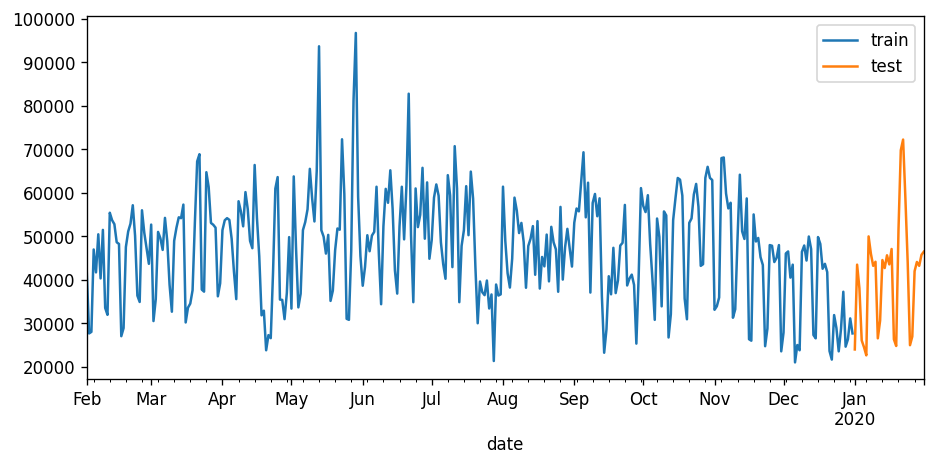

In [82]:
fig, ax=plt.subplots(figsize=(9, 4))
train_general['consumption'].plot(ax=ax, label='train')
test_general['consumption'].plot(ax=ax, label='test')
ax.legend();

# Autoreg forecaster

In [83]:
from skforecast.ForecasterAutoreg import ForecasterAutoreg
from sklearn.ensemble import GradientBoostingRegressor

forecaster = ForecasterAutoreg(
                regressor = GradientBoostingRegressor(random_state=123),
                lags = 14
             )

forecaster.fit(y=train_general['consumption'])

forecaster

ForecasterAutoreg 
Regressor: GradientBoostingRegressor(random_state=123) 
Lags: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14] 
Window size: 14 
Included exogenous: False 
Type of exogenous variable: None 
Exogenous variables names: None 
Training range: [0, 333] 
Training index type: RangeIndex 
Training index frequency: 1 
Regressor parameters: {'alpha': 0.9, 'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'squared_error', 'max_depth': 3, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_iter_no_change': None, 'random_state': 123, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False} 
Creation date: 2022-04-19 22:46:54 
Last fit date: 2022-04-19 22:46:54 
Skforecast version: 0.4.3 

31


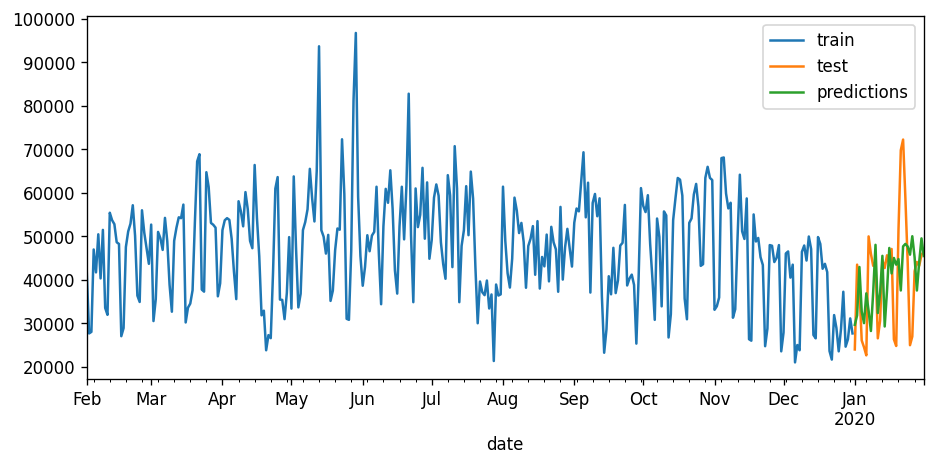

In [84]:
predictions = forecaster.predict(steps=len(test_general))
print(len(predictions))
predictions.index = test_general.index
fig, ax = plt.subplots(figsize=(9, 4))
train_general['consumption'].plot(ax=ax, label='train')
test_general['consumption'].plot(ax=ax, label='test')
predictions.plot(ax=ax, label='predictions')
ax.legend();

# Clusterización de los IDs
Como hemos visto, el comportamiento de los contadores no es igualitario, por ello, puede ser una buena idea realizar una clusterización para determinar diferentes grupos de IDs y por tanto aplicar un modelo para cada grupo.
### Preparación de datos

In [85]:
all_id_group = df_daily_consumptions.groupby(['id','datetime']).sum()
all_id_group

consumption
id   datetime               
0    2019-02-01          243
     2019-02-02          236
     2019-02-03          335
     2019-02-04          252
     2019-02-05          220
...                      ...
2748 2019-08-03          313
     2019-09-14            8
2749 2019-08-06            0
     2019-10-11            2
2756 2019-04-06           12

[890837 rows x 1 columns]

In [86]:
consumption_series = dict()

water_consumptions_date_id_df = all_id_group.reset_index()
names = []

for id in set(water_consumptions_date_id_df['id']):
  id_df = water_consumptions_date_id_df[water_consumptions_date_id_df['id'] == id]
  date_consumption_df = id_df.loc[:,["datetime","consumption"]]
  date_consumption_df.set_index("datetime",inplace=True)
  date_consumption_df.sort_index(inplace=True)
  consumption_series[id] = date_consumption_df
  names.append(id)
  print('id:', id)

id: 0
id: 1
id: 2
id: 3
id: 4
id: 5
id: 6
id: 7
id: 8
id: 9
id: 10
id: 11
id: 12
id: 13
id: 14
id: 15
id: 16
id: 17
id: 18
id: 19
id: 20
id: 21
id: 22
id: 23
id: 24
id: 25
id: 26
id: 27
id: 28
id: 29
id: 30
id: 31
id: 32
id: 33
id: 34
id: 35
id: 36
id: 37
id: 38
id: 39
id: 40
id: 41
id: 42
id: 43
id: 44
id: 45
id: 46
id: 47
id: 48
id: 49
id: 50
id: 51
id: 52
id: 53
id: 54
id: 55
id: 56
id: 57
id: 58
id: 59
id: 60
id: 61
id: 62
id: 63
id: 64
id: 65
id: 66
id: 67
id: 68
id: 69
id: 70
id: 71
id: 72
id: 73
id: 74
id: 75
id: 76
id: 77
id: 78
id: 79
id: 80
id: 81
id: 82
id: 83
id: 84
id: 85
id: 86
id: 87
id: 88
id: 89
id: 90
id: 91
id: 92
id: 93
id: 94
id: 95
id: 96
id: 97
id: 98
id: 99
id: 100
id: 101
id: 102
id: 103
id: 104
id: 105
id: 106
id: 107
id: 108
id: 109
id: 110
id: 111
id: 112
id: 113
id: 114
id: 115
id: 116
id: 117
id: 118
id: 119
id: 120
id: 121
id: 122
id: 123
id: 124
id: 125
id: 126
id: 127
id: 128
id: 129
id: 130
id: 131
id: 132
id: 133
id: 134
id: 135
id: 136
id: 137
id: 13

Probamos cualquiera y vemos cuánto suma

In [87]:
consumption_series[685]

,consumption
datetime,
2019-02-01,547
2019-02-02,454
2019-02-03,746
2019-02-04,361
2019-02-05,431
...,...
2020-01-27,504
2020-01-28,1162
2020-01-29,573


In [88]:
consumption_series[685].sum()

consumption    180434
dtype: int64

Vamos a ver la longitud de las series

In [89]:
ind = 0
max_length = 0
longest_serie = None
for index in consumption_series:
  serie = consumption_series[index]
  print("["+str(ind)+"] ", serie.index[0], serie.index[len(serie)-1])
  ind+=1
  if len(serie) > max_length:
    max_length = len(serie)
    longest_serie = serie

[0]  2019-02-01 00:00:00 2020-01-31 00:00:00
[1]  2019-02-01 00:00:00 2020-01-31 00:00:00
[2]  2019-02-01 00:00:00 2020-01-31 00:00:00
[3]  2019-02-01 00:00:00 2020-01-31 00:00:00
[4]  2019-02-01 00:00:00 2020-01-31 00:00:00
[5]  2019-02-01 00:00:00 2020-01-31 00:00:00
[6]  2019-02-01 00:00:00 2020-01-31 00:00:00
[7]  2019-02-01 00:00:00 2020-01-31 00:00:00
[8]  2019-02-01 00:00:00 2020-01-31 00:00:00
[9]  2019-02-01 00:00:00 2020-01-31 00:00:00
[10]  2019-02-01 00:00:00 2020-01-31 00:00:00
[11]  2019-02-01 00:00:00 2020-01-31 00:00:00
[12]  2019-02-01 00:00:00 2020-01-31 00:00:00
[13]  2019-02-01 00:00:00 2020-01-31 00:00:00
[14]  2019-02-01 00:00:00 2020-01-31 00:00:00
[15]  2019-02-01 00:00:00 2020-01-31 00:00:00
[16]  2019-02-01 00:00:00 2020-01-31 00:00:00
[17]  2019-02-01 00:00:00 2020-01-31 00:00:00
[18]  2019-02-01 00:00:00 2020-01-31 00:00:00
[19]  2019-02-01 00:00:00 2020-01-31 00:00:00
[20]  2019-02-01 00:00:00 2020-01-31 00:00:00
[21]  2019-02-01 00:00:00 2020-01-31 00:00:0

Cual es la más larga

In [90]:
max_length

365

Asociamos cada ID a la longitud de su serie

In [91]:
problems_index = []

for id in consumption_series.keys():
    if len(consumption_series[id])!= max_length:
        problems_index.append(id)
        consumption_series[id] = consumption_series[id].reindex(longest_serie.index)
problems_index

[11,
 23,
 26,
 32,
 33,
 34,
 35,
 37,
 39,
 54,
 62,
 64,
 67,
 72,
 73,
 74,
 76,
 78,
 79,
 85,
 112,
 113,
 116,
 135,
 136,
 138,
 145,
 155,
 159,
 167,
 185,
 192,
 193,
 199,
 203,
 206,
 209,
 210,
 215,
 223,
 226,
 231,
 233,
 234,
 237,
 241,
 242,
 243,
 254,
 260,
 261,
 271,
 279,
 284,
 293,
 299,
 311,
 312,
 313,
 316,
 322,
 323,
 330,
 345,
 347,
 351,
 360,
 361,
 371,
 386,
 404,
 406,
 414,
 418,
 420,
 426,
 438,
 441,
 449,
 450,
 454,
 455,
 457,
 461,
 466,
 472,
 476,
 478,
 489,
 493,
 501,
 514,
 525,
 526,
 549,
 557,
 565,
 571,
 577,
 581,
 584,
 595,
 605,
 615,
 618,
 622,
 624,
 626,
 630,
 644,
 651,
 654,
 655,
 659,
 661,
 664,
 666,
 671,
 697,
 700,
 712,
 725,
 730,
 737,
 746,
 762,
 775,
 777,
 782,
 794,
 795,
 807,
 812,
 813,
 815,
 824,
 825,
 831,
 833,
 837,
 839,
 855,
 860,
 872,
 875,
 880,
 884,
 885,
 899,
 910,
 914,
 916,
 918,
 931,
 937,
 938,
 945,
 950,
 952,
 953,
 959,
 963,
 967,
 969,
 981,
 983,
 984,
 985,
 996,
 997,


In [92]:
for index in consumption_series:
  serie = consumption_series[index]
  print("["+str(index)+"] ", serie.index[0], serie.index[len(serie)-1], len(serie))

[0]  2019-02-01 00:00:00 2020-01-31 00:00:00 365
[1]  2019-02-01 00:00:00 2020-01-31 00:00:00 365
[2]  2019-02-01 00:00:00 2020-01-31 00:00:00 365
[3]  2019-02-01 00:00:00 2020-01-31 00:00:00 365
[4]  2019-02-01 00:00:00 2020-01-31 00:00:00 365
[5]  2019-02-01 00:00:00 2020-01-31 00:00:00 365
[6]  2019-02-01 00:00:00 2020-01-31 00:00:00 365
[7]  2019-02-01 00:00:00 2020-01-31 00:00:00 365
[8]  2019-02-01 00:00:00 2020-01-31 00:00:00 365
[9]  2019-02-01 00:00:00 2020-01-31 00:00:00 365
[10]  2019-02-01 00:00:00 2020-01-31 00:00:00 365
[11]  2019-02-01 00:00:00 2020-01-31 00:00:00 365
[12]  2019-02-01 00:00:00 2020-01-31 00:00:00 365
[13]  2019-02-01 00:00:00 2020-01-31 00:00:00 365
[14]  2019-02-01 00:00:00 2020-01-31 00:00:00 365
[15]  2019-02-01 00:00:00 2020-01-31 00:00:00 365
[16]  2019-02-01 00:00:00 2020-01-31 00:00:00 365
[17]  2019-02-01 00:00:00 2020-01-31 00:00:00 365
[18]  2019-02-01 00:00:00 2020-01-31 00:00:00 365
[19]  2019-02-01 00:00:00 2020-01-31 00:00:00 365
[20]  2019

### Normalización y tratamiento de NAs

Aquellos que no tienen el total de días, deben tener NAs, por tanto vamos a ver cuantos isnull tenemos

In [93]:
def nan_counter(dict_of_series):
    for index in dict_of_series:
      n_nan = dict_of_series[index].isnull().sum().sum()
      if n_nan > 0:
        print('serie', index, 'nan', n_nan)

nan_counter(consumption_series)

serie 11 nan 85
serie 23 nan 20
serie 26 nan 96
serie 32 nan 64
serie 33 nan 18
serie 34 nan 96
serie 35 nan 98
serie 37 nan 107
serie 39 nan 101
serie 54 nan 95
serie 62 nan 14
serie 64 nan 27
serie 67 nan 13
serie 72 nan 94
serie 73 nan 11
serie 74 nan 101
serie 76 nan 95
serie 78 nan 19
serie 79 nan 64
serie 85 nan 53
serie 112 nan 3
serie 113 nan 40
serie 116 nan 264
serie 135 nan 98
serie 136 nan 108
serie 138 nan 23
serie 145 nan 94
serie 155 nan 94
serie 159 nan 40
serie 167 nan 160
serie 185 nan 53
serie 192 nan 98
serie 193 nan 101
serie 199 nan 98
serie 203 nan 101
serie 206 nan 103
serie 209 nan 144
serie 210 nan 7
serie 215 nan 3
serie 223 nan 3
serie 226 nan 15
serie 231 nan 152
serie 233 nan 101
serie 234 nan 95
serie 237 nan 98
serie 241 nan 12
serie 242 nan 14
serie 243 nan 94
serie 254 nan 27
serie 260 nan 7
serie 261 nan 59
serie 271 nan 4
serie 279 nan 101
serie 284 nan 16
serie 293 nan 132
serie 299 nan 40
serie 311 nan 96
serie 312 nan 108
serie 313 nan 9
serie 316

Vamos a rellenar esos huecos interpolando los valores (método lineal)

In [94]:
for i in problems_index:
    consumption_series[i].interpolate(limit_direction="both",inplace=True)
nan_counter(consumption_series)

Ahora, antes de aplicar los algoritmos de clusterización es buena idea hacer una transformación de los datos para estar todos en una escala entre 1 y 0

In [95]:
from sklearn.preprocessing import MinMaxScaler

for index in consumption_series:
    normalized = MinMaxScaler()
    consumption_series[index] = normalized.fit_transform(consumption_series[index])
    consumption_series[index] = consumption_series[index].reshape(len(consumption_series[index]))

In [96]:
consumption_series

{0: array([0.39836066, 0.38688525, 0.54918033, 0.41311475, 0.36065574,
        0.45245902, 0.45409836, 0.31639344, 0.4295082 , 0.51639344,
        0.36721311, 0.55245902, 0.35901639, 0.43278689, 0.6295082 ,
        0.45737705, 0.56229508, 0.52459016, 0.67213115, 0.42459016,
        0.51311475, 0.62459016, 0.36393443, 0.58196721, 0.62786885,
        0.40655738, 0.5147541 , 0.29508197, 0.34098361, 0.37704918,
        0.58032787, 0.52622951, 0.52295082, 0.49672131, 0.39836066,
        0.22131148, 0.43606557, 0.69344262, 0.89344262, 0.36065574,
        0.34262295, 0.78032787, 0.53114754, 0.46885246, 0.36885246,
        0.35081967, 0.66557377, 0.46557377, 0.62295082, 0.30983607,
        0.48032787, 0.6295082 , 0.37377049, 0.27704918, 0.4704918 ,
        0.5295082 , 0.75245902, 0.4852459 , 0.65409836, 0.62295082,
        0.50327869, 0.65245902, 0.84590164, 0.37868852, 0.71803279,
        0.63442623, 0.50655738, 0.53934426, 0.54590164, 0.53114754,
        0.59344262, 0.38360656, 0.34754098, 0

# Buscar la mejor clusterización
Para el desarrollo del problema buscamos identificar distintos patrones de comportamiento en las series de consumo. Para ello, vamos a probar clusterizarlas con distintos algoritmos populares y ver qué resultado nos dan.
## Som
Una vez todos los datos en la misma escala vamos a aplicar el método de clusterización de Self Organizing Maps (SOM), del que se puede encontrar más información aquí: https://medium.com/@abhinavr8/self-organizing-maps-ff5853a118d4
 Y un notebook de ejemplo en clusterización aquí: https://www.kaggle.com/izzettunc/introduction-to-time-series-clustering


In [97]:
import math
from minisom import MiniSom

consumptions_series_list = [consumption_series[key] for key in consumption_series.keys()]

som_x = som_y = math.ceil(math.sqrt(math.sqrt(len(consumptions_series_list))))

som = MiniSom(som_x, som_y,len(consumptions_series_list[0]), sigma=0.3, learning_rate = 0.1)

som.random_weights_init(consumptions_series_list)
som.train(consumptions_series_list, 10000)

In [98]:
def plot_som_series_averaged_center(som_x, som_y, win_map):
    fig, axs = plt.subplots(som_x,som_y,figsize=(25,25))
    fig.suptitle('Clusters')
    for x in range(som_x):
        for y in range(som_y):
            cluster = (x,y)
            if cluster in win_map.keys():
                for series in win_map[cluster]:
                    axs[cluster].plot(series,c="gray",alpha=0.5) 
                axs[cluster].plot(np.average(np.vstack(win_map[cluster]),axis=0),c="red")
            cluster_number = x*som_y+y+1
            axs[cluster].set_title(f"Cluster {cluster_number}")

    plt.show()

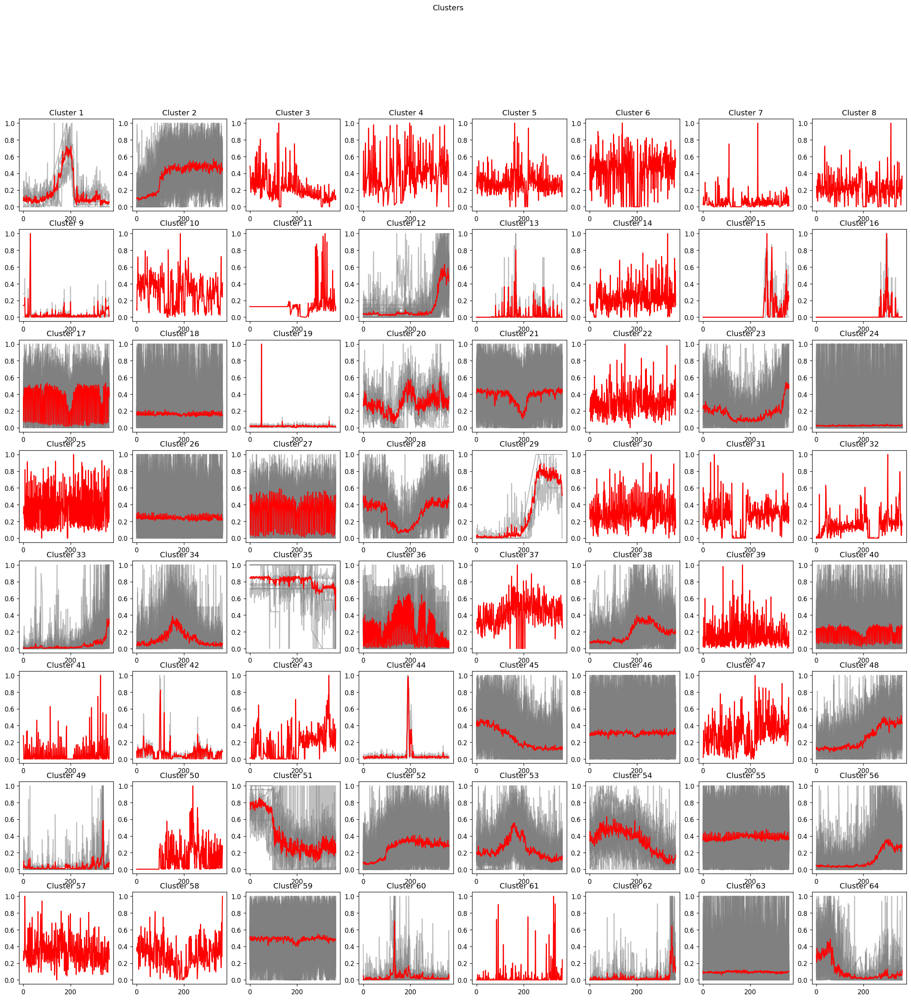

In [99]:
win_map = som.win_map(consumptions_series_list)

plot_som_series_averaged_center(som_x, som_y, win_map);

Detecta 64 clusters y vemos que la mayoría de ellos son de una única serie temporal o pocas más. Con lo cual vamos a descartarlo porque buscamos comportamientos más generales.

## K-MEANS
Tras la clusterización de los IDs por el método SOM, vimos que teníamos demasiados clusteres y la mitad de ellos eran series individuales, por ello nos decidimos a probar otro método de clusterización. En este caso, utilizaremos el siempre confiable K-means, del cual vamos a buscar la mejor parametrización posible. Para poder aplicar este algoritmo, en primer lugar tenemos que preparar el conjunto de datos para trabajar con él.

## Preparación de los datos

In [100]:
select = ['id','datetime','consumption']
id_date_consumption = pd.read_csv(path,usecols=select, sep=",")
id_date_consumption.head(5)

,id,datetime,consumption
0,0,2019-02-01,243
1,0,2019-02-02,236
2,0,2019-02-03,335
3,0,2019-02-04,252
4,0,2019-02-05,220


In [101]:
id_date_consumption['datetime'] = id_date_consumption['datetime'].astype('datetime64[ns]')
id_date_consumption['datetime'] = id_date_consumption.apply (lambda row: row.datetime.date(), axis=1)

Seleccionamos las series completas

In [102]:
id_count = id_date_consumption.groupby(['id']).size()
complete_series_ids = id_count[id_count == 365]
complete_series_ids = complete_series_ids.reset_index()
print('Número de series completas: ', len(complete_series_ids))

Número de series completas:  1975


Y filtramos

In [103]:
complete_series_df = id_date_consumption[id_date_consumption['id'].isin(complete_series_ids['id'])]
complete_series_df

,id,datetime,consumption
0,0,2019-02-01,243
1,0,2019-02-02,236
2,0,2019-02-03,335
3,0,2019-02-04,252
4,0,2019-02-05,220
...,...,...,...
846742,2400,2020-01-27,80
846743,2400,2020-01-28,60
846744,2400,2020-01-29,72
846745,2400,2020-01-30,43


In [104]:
consumption_series = dict()

for id in set(complete_series_df['id']):
  id_df = complete_series_df[complete_series_df['id'] == id]
  date_consumption_df = id_df.loc[:,["datetime","consumption"]]
  date_consumption_df.set_index("datetime",inplace=True)
  date_consumption_df.sort_index(inplace=True)
  consumption_series[id] = date_consumption_df

Para realizar la clusterización, podemos utilizar distintos métodos de preprocesamiento de datos como son la normalización, que sklearn nos provee del algoritmo MinMax como la estandarización con el algoritmo StandardScaler.

### Normalización con MinMax

In [105]:
from sklearn.preprocessing import MinMaxScaler

for index in consumption_series:
    scaler = MinMaxScaler()
    consumption_series[index] = scaler.fit_transform(consumption_series[index])
    consumption_series[index] = consumption_series[index].reshape(len(consumption_series[index]))
consumption_series[1202]

array([6.79063518e-01, 6.04911097e-01, 6.09599222e-01, 6.59396261e-01,
       5.80155509e-01, 5.84043222e-01, 5.94848779e-01, 6.35898462e-01,
       5.14950546e-01, 5.08947459e-01, 7.15911040e-01, 6.96358127e-01,
       5.28271683e-01, 6.24578355e-01, 5.67863473e-01, 3.81024527e-01,
       3.75478818e-01, 5.81213195e-01, 5.24526900e-01, 5.72237151e-01,
       5.57886913e-01, 5.94991710e-01, 4.78846264e-01, 4.79446573e-01,
       6.27379795e-01, 5.90446515e-01, 6.60568292e-01, 7.71854096e-01,
       8.94345663e-01, 5.13835687e-01, 5.95706363e-01, 7.73540678e-01,
       7.49528329e-01, 8.78366017e-01, 6.40700932e-01, 6.06254645e-01,
       3.92201704e-01, 4.14899091e-01, 6.42215997e-01, 6.24578355e-01,
       6.22577325e-01, 6.38299697e-01, 6.44531473e-01, 4.17471843e-01,
       4.67726259e-01, 4.19358527e-01, 4.24875650e-01, 6.25035733e-01,
       6.15430793e-01, 7.34606369e-01, 5.80727231e-01, 5.71379567e-01,
       9.23760791e-01, 9.21874107e-01, 9.41427020e-01, 1.00000000e+00,
      

In [106]:
water_series_anonimized = list(consumption_series.values())
water_series_anonimized[0]

array([0.39836066, 0.38688525, 0.54918033, 0.41311475, 0.36065574,
       0.45245902, 0.45409836, 0.31639344, 0.4295082 , 0.51639344,
       0.36721311, 0.55245902, 0.35901639, 0.43278689, 0.6295082 ,
       0.45737705, 0.56229508, 0.52459016, 0.67213115, 0.42459016,
       0.51311475, 0.62459016, 0.36393443, 0.58196721, 0.62786885,
       0.40655738, 0.5147541 , 0.29508197, 0.34098361, 0.37704918,
       0.58032787, 0.52622951, 0.52295082, 0.49672131, 0.39836066,
       0.22131148, 0.43606557, 0.69344262, 0.89344262, 0.36065574,
       0.34262295, 0.78032787, 0.53114754, 0.46885246, 0.36885246,
       0.35081967, 0.66557377, 0.46557377, 0.62295082, 0.30983607,
       0.48032787, 0.6295082 , 0.37377049, 0.27704918, 0.4704918 ,
       0.5295082 , 0.75245902, 0.4852459 , 0.65409836, 0.62295082,
       0.50327869, 0.65245902, 0.84590164, 0.37868852, 0.71803279,
       0.63442623, 0.50655738, 0.53934426, 0.54590164, 0.53114754,
       0.59344262, 0.38360656, 0.34754098, 0.52786885, 0.46229

### Elbow code

Uno de los métodos más usados para encontrar la correcta parametrización de un K-means es el Elbow Method, en este se calculan las distancias entre puntos y se hace una suma de la distancia entre los puntos para diferente cantidad de clusteres, es decir, un k-means por cada número de clusters. Se basa en que la cantidad correcta de clusteres es en la que la sum de distancias cuadradas deja de cambiar significativamente. En nuestro caso, como con el anterior método conseguimos 64 clusteres, vamos a probar la ejecucción desde 1 a 64 y ver cual sería la óptima

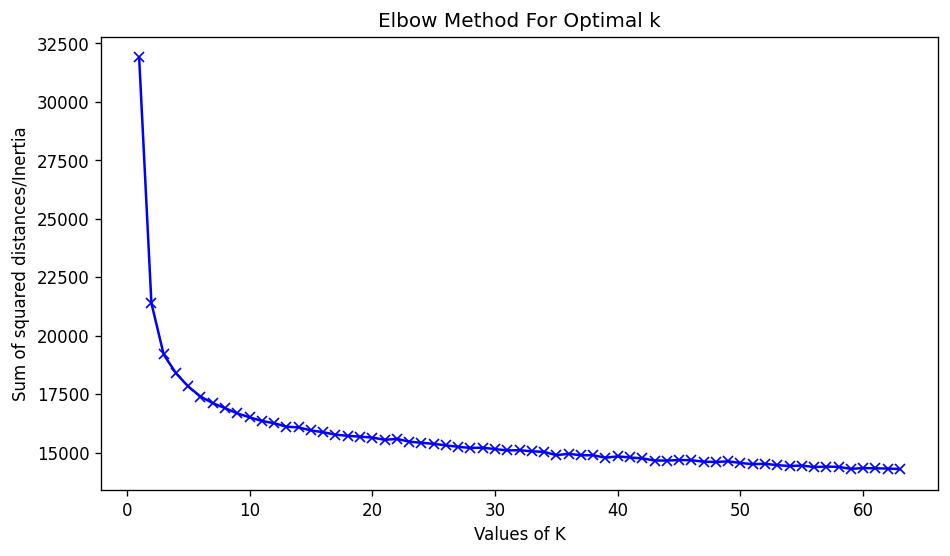

In [107]:
import sklearn
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

Sum_of_squared_distances = []
K = range(1,64)
for num_clusters in K :
 kmeans = KMeans(n_clusters=num_clusters)
 kmeans.fit(water_series_anonimized)
 Sum_of_squared_distances.append(kmeans.inertia_)
plt.plot(K,Sum_of_squared_distances,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Sum of squared distances/Inertia') 
plt.title('Elbow Method For Optimal k')
plt.show()

### Silhouette score
Para asegurarnos vamos a recurrir también el método Silhouette, que tiene un funcionamiento parecido al Elbow


In [ ]:
range_n_clusters = range(2,64)
silhouette_avg = []
iter_per_n_clusters = 5
for num_clusters in range_n_clusters:
  total = 0
  for i in range(0, iter_per_n_clusters): # To evite randomness
    # initialise kmeans
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(water_series_anonimized)
    cluster_labels = kmeans.labels_
    total = total + silhouette_score(water_series_anonimized, cluster_labels)
  # silhouette score
  silhouette_avg.append(total / iter_per_n_clusters)
plt.plot(range_n_clusters,silhouette_avg,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Silhouette score') 
plt.title('Silhouette analysis For Optimal k')
plt.show()

### Aplicación K-MEANS mejores parámetros

In [ ]:
my_seed = 0
optimal_number_clusters = 10
kmeans = KMeans(n_clusters=optimal_number_clusters, random_state=my_seed)
kmeans.fit(water_series_anonimized)
cluster_labels = kmeans.labels_

y, x, _ = plt.hist(cluster_labels)

print(x.max())
print(y.max())

In [ ]:
def most_frequent(cluster_labels):
    return max(set(cluster_labels), key = list(cluster_labels).count)
 
print(most_frequent(cluster_labels))

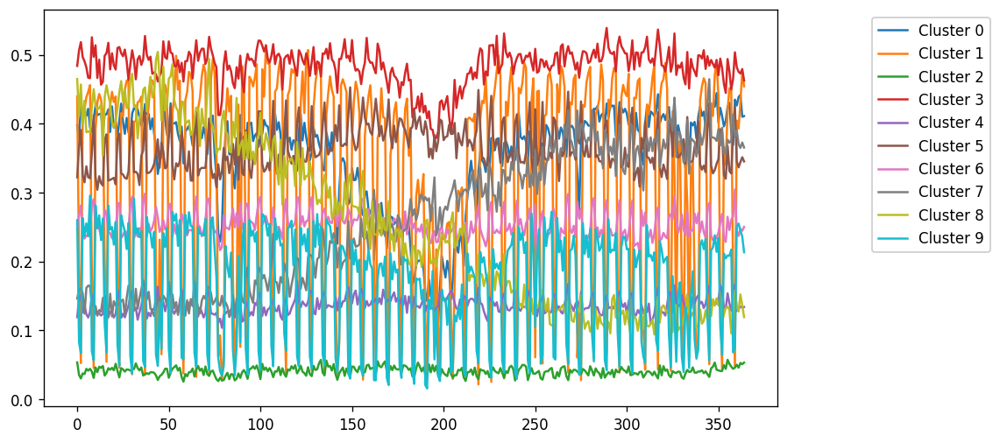

In [111]:
centers = kmeans.cluster_centers_
for i in range(len(centers)):
  plt.plot(centers[i], label='Cluster {}'.format(i));
plt.legend(bbox_to_anchor=(1.3,1), framealpha=1, frameon=True);

In [112]:
id_cluster = dict()
for index in consumption_series:
    predicted = kmeans.predict([consumption_series[index]])
    id_cluster[index] = predicted[0]
complete_series_df['cluster'] = complete_series_df.apply(lambda row: id_cluster[row.id], axis = 1)
complete_series_df

,id,datetime,consumption,cluster
0,0,2019-02-01,243,3
1,0,2019-02-02,236,3
2,0,2019-02-03,335,3
3,0,2019-02-04,252,3
4,0,2019-02-05,220,3
...,...,...,...,...
846742,2400,2020-01-27,80,4
846743,2400,2020-01-28,60,4
846744,2400,2020-01-29,72,4
846745,2400,2020-01-30,43,4


In [113]:
from datetime import date

water_consumption_train = complete_series_df[complete_series_df['datetime'] < date(2020, 1, 1)]
water_consumption_test = complete_series_df[complete_series_df['datetime'] >= date(2020, 1, 1)]
print('Número de días de entrenamiento:', len(water_consumption_train.groupby('datetime')))
print('Número de días de test:', len(water_consumption_test.groupby('datetime')))

Número de días de entrenamiento: 334
Número de días de test: 31


In [114]:
water_consumption_train.to_csv('~/water_consumption_train.csv', index=False)
water_consumption_test.to_csv('~/water_consumption_test.csv', index=False)

# Exploración de datos de los clusters

Ahora que ya hemos obtenido los distintos clusteres que vamos a utilizar en los modelos, podemos mirar los datos de estos para ver como se comportan, para poder elegir correctamente el modelo.

In [115]:
water_consumption_train = pd.read_csv('~/water_consumption_train.csv')
water_consumption_test = pd.read_csv('~/water_consumption_test.csv')

In [116]:
from IPython.display import display_html
def display_side_by_side(*args):
    html_str=''
    for df in args:
        html_str+=df.to_html()
    display_html(html_str.replace('table','table style="display:inline"'),raw=True)


display_side_by_side(water_consumption_train.tail(),water_consumption_test.head())

,id,datetime,consumption,cluster
659645,2400,2019-12-27,78,4
659646,2400,2019-12-28,94,4
659647,2400,2019-12-29,180,4
659648,2400,2019-12-30,178,4
659649,2400,2019-12-31,131,4
,id,datetime,consumption,cluster
0,0,2020-01-01,267,3
1,0,2020-01-02,252,3
2,0,2020-01-03,208,3
3,0,2020-01-04,427,3


(array([ 49098.,  18704., 140280.,  57448., 106212.,  93520., 119238.,
         26386.,  18036.,  30728.]),
 array([0. , 0.9, 1.8, 2.7, 3.6, 4.5, 5.4, 6.3, 7.2, 8.1, 9. ]),
 <a list of 10 Patch objects>)

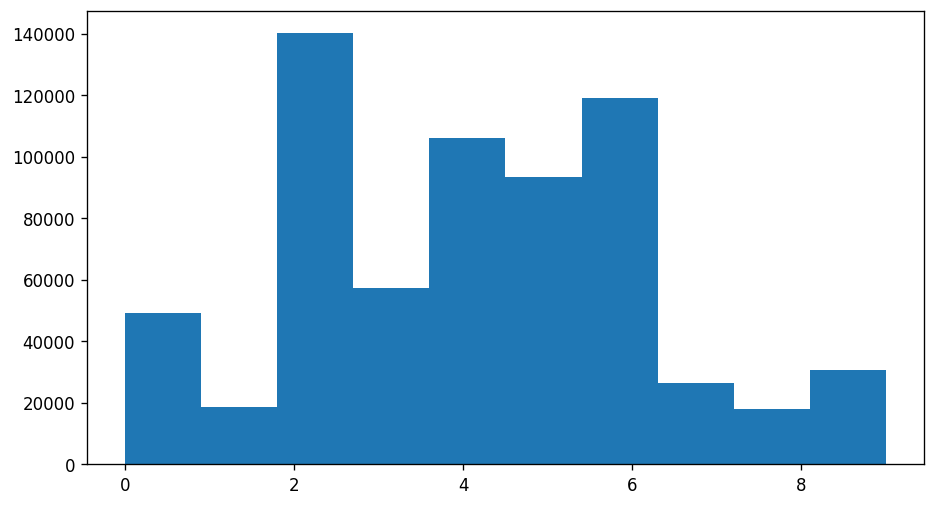

In [117]:
plt.hist(water_consumption_train['cluster'], bins = 10)

(array([ 4557.,  1736., 13020.,  5332.,  9858.,  8680., 11067.,  2449.,
         1674.,  2852.]),
 array([0. , 0.9, 1.8, 2.7, 3.6, 4.5, 5.4, 6.3, 7.2, 8.1, 9. ]),
 <a list of 10 Patch objects>)

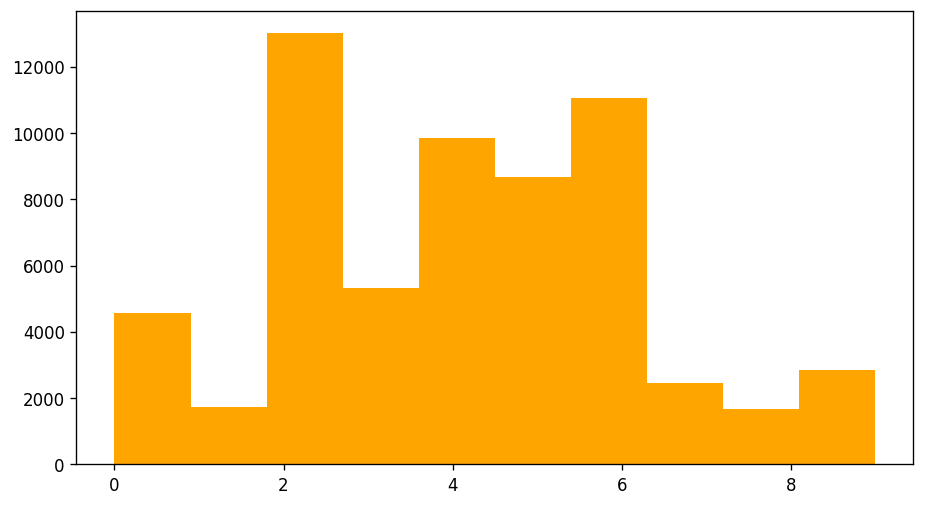

In [118]:
plt.hist(water_consumption_test['cluster'], bins = 10, color = 'orange')

Vamos a coger el cluster 2 como base, y vemos como se comporta y probamos predicciones sobre él

In [119]:
train_cluster_2 = water_consumption_train[water_consumption_train['cluster'] == 2]
test_cluster_2 = water_consumption_test[water_consumption_test['cluster'] == 2]

train_cluster_2_gr = train_cluster_2.groupby('id').sum()
test_cluster_2_gr = test_cluster_2.groupby('id').sum()

display_side_by_side(train_cluster_2.tail(10),test_cluster_2.head(10))

,id,datetime,consumption,cluster
656300,2387,2019-12-22,72,2
656301,2387,2019-12-23,29,2
656302,2387,2019-12-24,143,2
656303,2387,2019-12-25,24,2
656304,2387,2019-12-26,42,2
656305,2387,2019-12-27,102,2
656306,2387,2019-12-28,56,2
656307,2387,2019-12-29,120,2
656308,2387,2019-12-30,18,2
656309,2387,2019-12-31,8,2


## Cluster 2
### Autoreg
Es un algoritmo para series autoregresivas que utiliza árboles de decisión, podemos aplicarlo de forma conjunta con el XGBoost el cual es un algoritmo muy popular en este tipo de problemas.

In [120]:
train_cluster_2['datetime'] = train_cluster_2['datetime'].astype('datetime64[ns]')
test_cluster_2['datetime'] = test_cluster_2['datetime'].astype('datetime64[ns]')
train_cluster_2_gr = train_cluster_2.drop(['id','cluster'], axis = 1, inplace = False)
train_cluster_2_grouped = train_cluster_2_gr.groupby('datetime').sum()
test_cluster_2_gr = test_cluster_2.drop(['id','cluster'], axis = 1, inplace = False)
test_cluster_2_grouped = test_cluster_2_gr.groupby('datetime').sum()

display_side_by_side(train_cluster_2_grouped.tail(10),test_cluster_2_grouped.head(10))

,consumption
datetime,
2019-12-22,45055
2019-12-23,56906
2019-12-24,57970
2019-12-25,61180
2019-12-26,70009
2019-12-27,61109
2019-12-28,47357
2019-12-29,35746
2019-12-30,44719


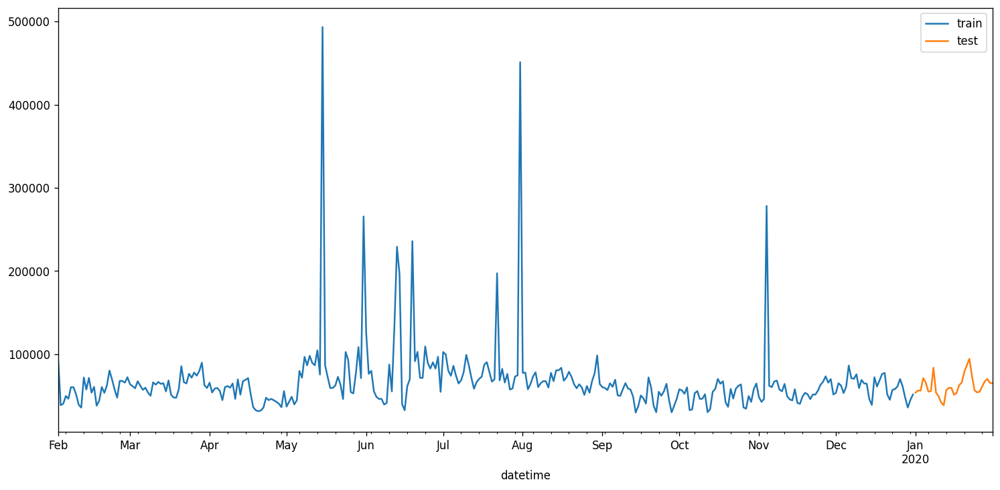

In [121]:
fig, ax=plt.subplots(figsize=(15, 7))
train_cluster_2_grouped['consumption'].plot(ax=ax, label='train')
test_cluster_2_grouped['consumption'].plot(ax=ax, label='test')
ax.legend();

In [122]:
from skforecast.ForecasterAutoreg import ForecasterAutoreg
from sklearn.ensemble import GradientBoostingRegressor

forecaster = ForecasterAutoreg(
                regressor = GradientBoostingRegressor(random_state=123),
                lags = 19)

forecaster.fit(y=train_cluster_2_grouped['consumption'])

forecaster

ForecasterAutoreg 
Regressor: GradientBoostingRegressor(random_state=123) 
Lags: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19] 
Window size: 19 
Included exogenous: False 
Type of exogenous variable: None 
Exogenous variables names: None 
Training range: [0, 333] 
Training index type: RangeIndex 
Training index frequency: 1 
Regressor parameters: {'alpha': 0.9, 'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'squared_error', 'max_depth': 3, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_iter_no_change': None, 'random_state': 123, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False} 
Creation date: 2022-04-19 23:04:34 
Last fit date: 2022-04-19 23:04:34 
Skforecast version: 0.4.3 

In [123]:
predictions = forecaster.predict(steps=len(test_cluster_2_grouped))
print(len(predictions))
predictions.index = test_cluster_2_grouped.index
predictions

31


datetime
2020-01-01     49579.853356
2020-01-02     57050.372330
2020-01-03     55109.526160
2020-01-04     59230.585645
2020-01-05     52153.664471
2020-01-06     46893.903440
2020-01-07     73123.735012
2020-01-08     70617.722531
2020-01-09     80079.830699
2020-01-10     70221.335819
2020-01-11     69908.477337
2020-01-12    121340.614902
2020-01-13     77825.691205
2020-01-14     88931.665321
2020-01-15     62878.748760
2020-01-16     58267.908479
2020-01-17     65720.675351
2020-01-18     62945.647293
2020-01-19     57470.601445
2020-01-20     53557.788746
2020-01-21     66063.641953
2020-01-22     58582.010053
2020-01-23     59655.110621
2020-01-24     69650.041529
2020-01-25     69094.833403
2020-01-26     69329.488540
2020-01-27     65711.107428
2020-01-28     98620.327657
2020-01-29     71328.622076
2020-01-30     72788.016568
2020-01-31     76436.665340
Name: pred, dtype: float64

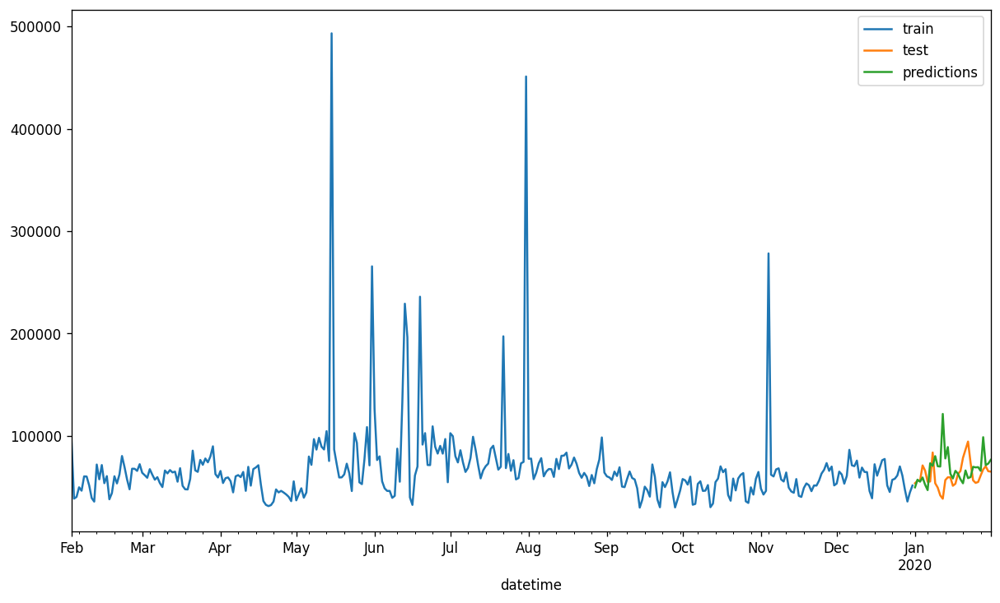

In [124]:
fig, ax = plt.subplots(figsize=(12, 7))
train_cluster_2_grouped['consumption'].plot(ax=ax, label='train')
test_cluster_2_grouped['consumption'].plot(ax=ax, label='test')
predictions.plot(ax=ax, label='predictions')
ax.legend();

In [125]:
from scipy import stats
from scipy.stats import zscore

z_score = stats.zscore(train_cluster_2_grouped)
filtered_entries = (z_score < 3).all(axis=1)
new_df = train_cluster_2_grouped[filtered_entries]
new_df.head()

,consumption
datetime,
2019-02-01,94487
2019-02-02,38560
2019-02-03,40241
2019-02-04,49645
2019-02-05,46313


In [126]:
forecaster = ForecasterAutoreg(
                regressor = GradientBoostingRegressor(random_state=123),
                lags = 25)

forecaster.fit(y=new_df['consumption'])
forecaster

ForecasterAutoreg 
Regressor: GradientBoostingRegressor(random_state=123) 
Lags: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25] 
Window size: 25 
Included exogenous: False 
Type of exogenous variable: None 
Exogenous variables names: None 
Training range: [0, 325] 
Training index type: RangeIndex 
Training index frequency: 1 
Regressor parameters: {'alpha': 0.9, 'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'squared_error', 'max_depth': 3, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_iter_no_change': None, 'random_state': 123, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False} 
Creation date: 2022-04-19 23:04:35 
Last fit date: 2022-04-19 23:04:35 
Skforecast version: 0.4.3 

In [127]:
predictions = forecaster.predict(steps=len(test_cluster_2_grouped))
predictions.index = test_cluster_2_grouped.index
print(len(predictions))

31


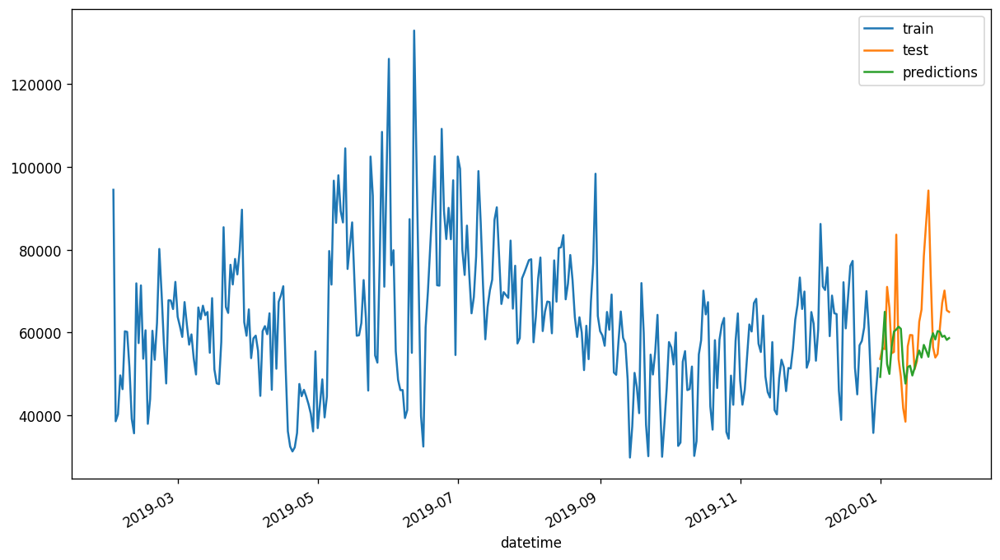

In [128]:
fig, ax = plt.subplots(figsize=(12, 7))
new_df['consumption'].plot(ax=ax, label='train')
test_cluster_2_grouped['consumption'].plot(ax=ax, label='test')
predictions.plot(ax=ax, label='predictions')
ax.legend();

## Holt - Winters seasonal method
 Este método produce valores suavizados exponencialmente para el nivel de la previsión, la tendencia de la previsión y el ajuste estacional para la previsión. Este método de aditivo estacional agrega el factor de estacionalidad a la previsión con tendencia, lo que produce una previsión de aditivo de Holt-Winters.

Este método es el mejor para datos con tendencia y estacionalidad que no aumentan a lo largo del tiempo. Su resultado es una previsión de curva que muestra los cambios estacionales en los datos.

In [129]:
y = pd.concat([train_cluster_2_grouped, test_cluster_2_grouped], axis = 0)
y = y['consumption']

y_to_train = train_cluster_2_grouped['consumption']
y_to_test = test_cluster_2_grouped['consumption']
predict_date = len(y) - len(y[:'2020-01-01'])
predict_date

30

In [130]:
from statsmodels.tsa.api import ExponentialSmoothing

def holt_win_sea(y,y_to_train,y_to_test,seasonal_type,seasonal_period,predict_date):
    
    y.plot(marker='o', color='black', legend=True, figsize=(14, 7))
    
    if seasonal_type == 'additive':
        fit1 = ExponentialSmoothing(y_to_train, seasonal_periods = seasonal_period, trend='add', seasonal='add').fit(use_boxcox=True)
        fcast1 = fit1.forecast(predict_date).rename('Additive')
        mse1 = ((fcast1 - y_to_test) ** 2).mean()
        print('The Root Mean Squared Error of additive trend, additive seasonal of '+ 
              'period season_length={} and a Box-Cox transformation {}'.format(seasonal_period,round(np.sqrt(mse1), 2)))
        
        fit2 = ExponentialSmoothing(y_to_train, seasonal_periods = seasonal_period, trend='add', seasonal='add', damped=True).fit(use_boxcox=True)
        fcast2 = fit2.forecast(predict_date).rename('Additive+damped')
        mse2 = ((fcast2 - y_to_test) ** 2).mean()
        print('The Root Mean Squared Error of additive damped trend, additive seasonal of '+ 
              'period season_length={} and a Box-Cox transformation {}'.format(seasonal_period,round(np.sqrt(mse2), 2)))
        
        fit1.fittedvalues.plot(style='--', color='red')
        fcast1.plot(style='--', marker='o', color='red', legend=True)
        fit2.fittedvalues.plot(style='--', color='green')
        fcast2.plot(style='--', marker='o', color='green', legend=True)
    
    elif seasonal_type == 'multiplicative':  
        fit3 = ExponentialSmoothing(y_to_train, seasonal_periods = seasonal_period, trend='add', seasonal='mul').fit(use_boxcox=True)
        fcast3 = fit3.forecast(predict_date).rename('Multiplicative')
        mse3 = ((fcast3 - y_to_test) ** 2).mean()
        print('The Root Mean Squared Error of additive trend, multiplicative seasonal of '+ 
              'period season_length={} and a Box-Cox transformation {}'.format(seasonal_period,round(np.sqrt(mse3), 2)))
        
        fit4 = ExponentialSmoothing(y_to_train, seasonal_periods = seasonal_period, trend='add', seasonal='mul', damped=True).fit(use_boxcox=True)
        fcast4 = fit4.forecast(predict_date).rename('Multiplicative+damped')
        mse4 = ((fcast3 - y_to_test) ** 2).mean()
        print('The Root Mean Squared Error of additive damped trend, multiplicative seasonal of '+ 
              'period season_length={} and a Box-Cox transformation {}'.format(seasonal_period,round(np.sqrt(mse4), 2)))
        
        fit3.fittedvalues.plot(style='--', color='red')
        fcast3.plot(style='--', marker='o', color='red', legend=True)
        fit4.fittedvalues.plot(style='--', color='green')
        fcast4.plot(style='--', marker='o', color='green', legend=True)
        
    else:
        print('Wrong Seasonal Type. Please choose between additive and multiplicative')

    plt.show()

The Root Mean Squared Error of additive trend, additive seasonal of period season_length=30 and a Box-Cox transformation 20940.41
The Root Mean Squared Error of additive damped trend, additive seasonal of period season_length=30 and a Box-Cox transformation 19821.44


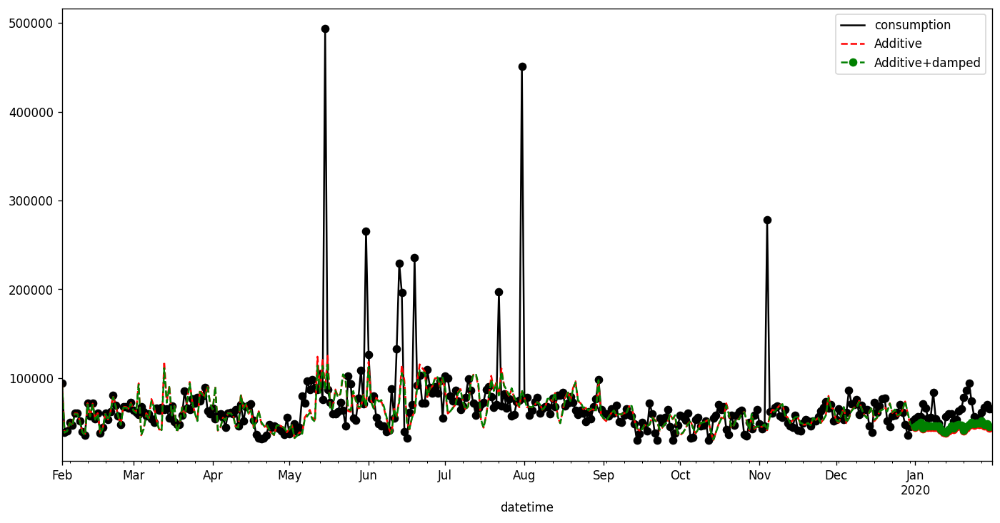

In [131]:
holt_win_sea(y, y_to_train,y_to_test,'additive',30, predict_date)

##SARIMA

Los modelos ARIMA son los modelos más populares para predicción en series temporales univariantes, en concreto, y puesto que tenemos una serie con alta estacionalidad, es muy interesante que probemos con el Seasonal-ARIMA

SARIMA ha de parametrizarse con tres ordenes diferentes, p,q y d, según el orden de autoregresión, la media móvil y el orden de diferenciación por ser un ARMA integrado, para obtener la mejor parametrización construimos la siguiente función que nos devuelve el índice de Akaike (AIC), y a menor AIC el modelo tenderá a ser más parsimonioso.

In [132]:
import itertools
import statsmodels.api as sm

def sarima_grid_search(y,seasonal_period):
    p = d = q = range(0, 2)
    pdq = list(itertools.product(p, d, q))
    seasonal_pdq = [(x[0], x[1], x[2],seasonal_period) for x in list(itertools.product(p, d, q))]
    
    mini = float('+inf')
    
    for param in pdq:
        for param_seasonal in seasonal_pdq:
            try:
                mod = sm.tsa.statespace.SARIMAX(y,
                                                order=param,
                                                seasonal_order=param_seasonal,
                                                enforce_stationarity=False,
                                                enforce_invertibility=False)

                results = mod.fit()
                
                if results.aic < mini:
                    mini = results.aic
                    param_mini = param
                    param_seasonal_mini = param_seasonal

            except:
                continue
    print('The set of parameters with the minimum AIC is: SARIMA{}x{} - AIC:{}'.format(param_mini, param_seasonal_mini, mini))

In [133]:
def sarima_train_test(y,order,seasonal_order,seasonal_period,pred_date,y_to_test):
    mod = sm.tsa.statespace.SARIMAX(y,
                                order=order,
                                seasonal_order=seasonal_order,
                                enforce_stationarity=False,
                                enforce_invertibility=False)

    results = mod.fit()
    print(results.summary().tables[1])
    
    results.plot_diagnostics(figsize=(16, 8))
    plt.show()
    

    pred = results.get_prediction(start=pd.to_datetime(pred_date), dynamic=False)
    pred_ci = pred.conf_int()
    y_forecasted = pred.predicted_mean
    mse = ((y_forecasted - y_to_test) ** 2).mean()
    print('The Root Mean Squared Error of SARIMA with season_length={} and dynamic = False {}'.format(seasonal_period,round(np.sqrt(mse), 2)))

    ax = y.plot(label='observed')
    y_forecasted.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7))
    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Sessions')
    plt.legend()
    plt.show()


    pred_dynamic = results.get_prediction(start=pd.to_datetime(pred_date), dynamic=True, full_results=True)
    pred_dynamic_ci = pred_dynamic.conf_int()
    y_forecasted_dynamic = pred_dynamic.predicted_mean
    mse_dynamic = ((y_forecasted_dynamic - y_to_test) ** 2).mean()
    print('The Root Mean Squared Error of SARIMA with season_length={} and dynamic = True {}'.format(seasonal_period,round(np.sqrt(mse_dynamic), 2)))

    ax = y.plot(label='observed')
    y_forecasted_dynamic.plot(label='Dynamic Forecast', ax=ax,figsize=(14, 7))
    ax.fill_between(pred_dynamic_ci.index,
                    pred_dynamic_ci.iloc[:, 0],
                    pred_dynamic_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Sessions')

    plt.legend()
    plt.show()
    
    return (results)

In [134]:
sarima_grid_search(y, 30)

The set of parameters with the minimum AIC is: SARIMA(1, 0, 1)x(0, 1, 1, 30) - AIC:7375.420854442838


The set of parameters with the minimum AIC is: SARIMA(1, 0, 1)x(0, 1, 1, 30) - AIC:6646.074014045578

In [ ]:
model = sarima_train_test(y,(1, 0, 1),(0, 1, 1, 30),30,'2020-01-01',y_to_test)

In [ ]:
def forecast(model,predict_steps,y):
    
    pred_uc = model.get_forecast(steps=predict_steps)

    #SARIMAXResults.conf_int, can change alpha,the default alpha = .05 returns a 95% confidence interval.
    pred_ci = pred_uc.conf_int()

    ax = y.plot(label='observed', figsize=(14, 7))
#     print(pred_uc.predicted_mean)
    pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.25)
    ax.set_xlabel('Date')
    ax.set_ylabel('Consumption')

    plt.legend()
    plt.show()
    
    # Produce the forcasted tables 
    pm = pred_uc.predicted_mean.reset_index()
    pm.columns = ['Date','Predicted_Mean']
    pci = pred_ci.reset_index()
    pci.columns = ['Date','Lower Bound','Upper Bound']
    final_table = pm.join(pci.set_index('Date'), on='Date')
    
    return (final_table)

In [ ]:
final_table = forecast(model,30,y)
final_table.head(30)

Con esto hemos obtenido un pequeño ejemplo de predicción que puede ser aplicado a la solución final del fichero de predicción.

# Segunda fase
En nuestro plan de pruebas para la segunda fase, tras el éxito del SARIMA en el cluster dos en la fase anterior, nos decidimos a aplicar este modelo a todos los clusters. Creamos una función para buscar la mejor parametrización para cada uno de los clusters.


In [ ]:
import itertools
import statsmodels.api as sm

def sarima_grid_search(y, seasonal_period):
    p = d = q = range(0, 2)
    pdq = list(itertools.product(p, d, q))
    seasonal_pdq = [(x[0], x[1], x[2],seasonal_period) for x in list(itertools.product(p, d, q))]
    
    mini = float('+inf')
    
    
    for param in pdq:
        for param_seasonal in seasonal_pdq:
            try:
                mod = sm.tsa.statespace.SARIMAX(y,
                                                order=param,
                                                seasonal_order=param_seasonal,
                                                enforce_stationarity=False,
                                                enforce_invertibility=False)
                results = mod.fit()
                
                if results.aic < mini:
                    mini = results.aic
                    param_mini = param
                    param_seasonal_mini = param_seasonal
            except:
                continue
    return (param_mini, param_seasonal_mini, mini)

def cluster_grouped_ts(dataset, cluster_id) -> pd.DataFrame:
  cluster_series = dataset[dataset['cluster'] == cluster_id]
  cluster_series.drop(['id','cluster'], axis = 1, inplace = True)
  return cluster_series.groupby('datetime').sum()

def grid_search_by_cluster(dataset, seasonal_period=30) -> dict:
  best_params_per_cluster = {}
  for cluster_id in set(dataset.cluster):
    cluster_ts = cluster_grouped_ts(dataset, cluster_id)
    best_params_cluster = sarima_grid_search(cluster_ts, seasonal_period)
    best_params_per_cluster[cluster_id] = best_params_cluster
  return best_params_per_cluster

In [ ]:
complete_series_df.head()

In [ ]:
def assign_cluster_or_default(id, id_clusters):
  if id in id_clusters.keys():
    return id_clusters[id]
  else:
    return 10

id_date_consumption['cluster'] = id_date_consumption.apply(lambda row: assign_cluster_or_default(row.id, id_cluster), axis = 1)
id_date_consumption.head()

In [ ]:
params_by_cluster = grid_search_by_cluster(id_date_consumption)
params_by_cluster

In [ ]:
def train_predict_by_id(dataset, params_per_cluster, predict_steps=14):
  column_names = ['id', 'day_1', 'day_2', 'day_3', 'day_4', 'day_5', 'day_6', 'day_7', 'week_1', 'week_2']
  df = pd.DataFrame(columns = column_names)
  ids = set(dataset['id'])
  for id in ids:
    try:
      print('id: {id} de {len}, completado: {percent:.2f}%'.format(id=id, len=len(ids), percent=(len(df)/len(ids))*100))
      current_id_time_serie = dataset[dataset['id'] == id]
      cluster = list(current_id_time_serie['cluster'])[0]
      best_order = params_per_cluster[cluster][0]
      best_seasonal_order = params_per_cluster[cluster][1]
      y = current_id_time_serie.consumption.values
      model = sm.tsa.statespace.SARIMAX(y,
                                    order=best_order,
                                    seasonal_order=best_seasonal_order,
                                    enforce_stationarity=False,
                                    enforce_invertibility=False)
      trained_model = model.fit()
      predicted = trained_model.get_forecast(steps=predict_steps)
      week_1 = sum(predicted.predicted_mean[:7])
      week_2 = sum(predicted.predicted_mean[7:])
      days_week_consumptions = np.append(np.append(predicted.predicted_mean[:7], week_1), week_2)
      to_append = np.concatenate(([id],days_week_consumptions))
    except:
      to_append = [id, 0, 0, 0, 0, 0, 0, 0, 0, 0]
    df.loc[len(df)] = to_append
  return df

In [ ]:
cluster_2_series = id_date_consumption[id_date_consumption['cluster'] == 2]
predictions_sarimax_df = train_predict_by_id(id_date_consumption, set(cluster_2_series['id']))
predictions_sarimax_df.head()

Además quisimos probar el algoritmo Prophet de Facebook y decidimos en una de las dos entregas añadirlo en el cluster 2 que fue el que mejoramos anteriormete. Para ello creamos una función que predice para cada id si es cluster 2 con este algoritmo y el dataset resultante podemos añadirlo al final.

In [ ]:
from fbprophet import Prophet
import statsmodels.api as sm

def train_predict_cluster_2_prophet(dataset, params_per_cluster, predict_steps=14):
  column_names = ['id', 'day_1', 'day_2', 'day_3', 'day_4', 'day_5', 'day_6', 'day_7', 'week_1', 'week_2']
  df = pd.DataFrame(columns = column_names)
  for id in set(dataset['id']):
    print('ID:', id)
    try:
      current_id_time_serie = dataset[dataset['id'] == id]
      print(current_id_time_serie.head())
      cluster = list(current_id_time_serie['cluster'])[0]
      if (cluster == 2):
        train_df = current_id_time_serie[['datetime', 'consumption']]
        train_df.columns = ['ds', 'y']
        predictor = Prophet()
        predictor.fit(train_df)
        future = predictor.make_future_dataframe(periods=predict_steps)
        predicted_df = predictor.predict(future)
        print(predicted_df.head())
        predicted = predicted_df.yhat
        week_1 = sum(predicted[:7])
        print('week_1', week_1)
        week_2 = sum(predicted[7:])
        print('week_2', week_2)
        days_week_consumptions = np.append(np.append(predicted[:7], week_1), week_2)
        print('days week', days_week_consumptions)
        to_append = np.concatenate(([id],days_week_consumptions))
        df.loc[len(df)] = to_append
        print(len(df))
    except:
      to_append = [id, 0, 0, 0, 0, 0, 0, 0, 0, 0]
  return df

In [ ]:
cluster_2_prophet_df = train_predict_cluster_2_prophet(id_date_consumption, set(cluster_2_series['id']))
cluster_2_prophet_df.head()

## Conclusiones entrega previa
El resultado de ambas pruebas fue bastante negativo en la entrega previa, estando muy por detrás incluso de soluciones anteriores. Echamos un ojo a qué podía fallar porque el algoritmo SARIMA a priori debería de mejorar al Autoregresor y vimos que este tipo de algoritmos suelen llevar mayor preparación previa para el entrenamiento y el predicción. Entonces decidimos aplicar la normalización o una estandarización como alternativa, tanto para los clusters como en el momento de entrenar y predecir. De esta manera hemos obtenido los siguientes clusters con el conjunto de datos estandarizado

In [ ]:
from sklearn.preprocessing import StandardScaler

consumption_series = dict()

water_consumptions_date_id_df = all_id_group.reset_index()
names = []

for id in set(complete_series_df['id']):
  id_df = water_consumptions_date_id_df[water_consumptions_date_id_df['id'] == id]
  date_consumption_df = id_df.loc[:,["datetime","consumption"]]
  date_consumption_df.set_index("datetime",inplace=True)
  date_consumption_df.sort_index(inplace=True)
  consumption_series[id] = date_consumption_df
  names.append(id)

for index in consumption_series:
    scaler = StandardScaler()
    consumption_series[index] = scaler.fit_transform(consumption_series[index])
    consumption_series[index] = consumption_series[index].reshape(len(consumption_series[index]))

water_series_anonimized = list(consumption_series.values())

my_seed = 0
optimal_number_clusters = 10
kmeans = KMeans(n_clusters=optimal_number_clusters, random_state=my_seed)
kmeans.fit(water_series_anonimized)
cluster_labels = kmeans.labels_

y, x, _ = plt.hist(cluster_labels)

## Centros K-MEANS datos estandizados

In [ ]:
centers = kmeans.cluster_centers_
for i in range(len(centers)):
  plt.plot(centers[i], label='Cluster {}'.format(i));
plt.legend(bbox_to_anchor=(1.3,1), framealpha=1, frameon=True);

Viendo que esta clusterización daba un resultado muy satisfactorio ya que se separaban por comportamiento y no tanto por valor del mismo, es decir no hacía distinción si era de alto consumo o bajo consumo si el comportamiento es similar, decidimos usar este, junto con el SARIMA por clusters, para la predicción final. Quedando el algoritmo de predicción de la siguiente manera

## Predicción SARIMA estandizado

In [ ]:
from skforecast.ForecasterAutoreg import ForecasterAutoreg
from sklearn.ensemble import GradientBoostingRegressor
import statsmodels.api as sm

def max_if_negative(x, y):
  if x < 0:
    return y
  else:
    return x

def combine_predictions(prediction_mean, prediction_high):
   return [max_if_negative(x, prediction_high[ind]) for ind, x in enumerate(prediction_mean)]

def train_predict_sarima_standarized(dataset, params_per_cluster, predict_steps=14):
  column_names = ['id', 'day_1', 'day_2', 'day_3', 'day_4', 'day_5', 'day_6', 'day_7', 'week_1', 'week_2']
  df = pd.DataFrame(columns = column_names)
  ids = set(dataset['id'])
  for id in ids:
    try:
      print('id: {id} de {len}, completado: {percent:.2f}%'.format(id=id, len=len(ids), percent=(len(df)/len(ids))*100))
      current_id_time_serie = dataset[dataset['id'] == id]
      cluster = list(current_id_time_serie['cluster'])[0]
      if cluster < 10:
        best_order = params_per_cluster[cluster][0]
        best_seasonal_order = params_per_cluster[cluster][1]
        y = current_id_time_serie.consumption.values
        scaler = StandardScaler()
        y_scaled = scaler.fit_transform(np.array(y)[:, np.newaxis])
        model = sm.tsa.statespace.SARIMAX(y_scaled,
                                      order=best_order,
                                      seasonal_order=best_seasonal_order,
                                      enforce_stationarity=False,
                                      enforce_invertibility=False)
        trained_model = model.fit()
        predicted_scaled = trained_model.get_forecast(steps=predict_steps)
        pred_ci = predicted_scaled.conf_int(alpha=0.5)
        predicted_mean = scaler.inverse_transform(predicted_scaled.predicted_mean.reshape(-1, 1))
        prediced_high = scaler.inverse_transform(pred_ci[:, 1].reshape(-1, 1))
        predicted = combine_predictions(predicted_mean, prediced_high)
        week_1 = sum(predicted[:7])
        week_2 = sum(predicted[7:])
        days_week_consumptions = np.append(np.append(predicted[:7], week_1), week_2)
        to_append = np.concatenate(([id],days_week_consumptions))
      else:
        forecaster = ForecasterAutoreg(
                  regressor = GradientBoostingRegressor(random_state=123),
                  lags = 25)

        forecaster.fit(y=current_id_time_serie['consumption'])

        predictions = forecaster.predict(predict_steps)
        week_1 = sum(predictions[:7])
        week_2 = sum(predictions[7:])
        days_week_consumptions = np.append(np.append(predictions[:7], week_1), week_2)
        to_append = np.concatenate(([id],days_week_consumptions))
    except:
      to_append = [id, 0, 0, 0, 0, 0, 0, 0, 0, 0]
    df.loc[len(df)] = to_append
  return df

## Procesamiento final

In [ ]:
predictions_sarima_standarized_df = train_predict_by_id(id_date_consumption, params_by_cluster)
predictions_sarima_standarized_df.head()

In [150]:
predictions_sarima_standarized_df.id = predictions_sarima_standarized_df.id.astype(int)
predictions_sarima_standarized_df[predictions_sarima_standarized_df < 0] = 0
predictions_sarima_standarized_df = predictions_sarima_standarized_df.sort_values(['id'])
rounded_predictions = predictions_sarima_standarized_df.round(2)

print(len(rounded_predictions))
rounded_predictions.to_csv('~/standared_sarima_water_prediction.txt', sep="|", index=False, header=False)

2747
